# Cloud Factory Pipeline Output Analysis

1. Look at the grid, mask, and skeletons
2. Look at the star forming sinks in the grid and find star forming clouds 
3. Radial structure plots 
4. Radial profile plots 
5. Data tables


See Full-Data-Table folder for how to combine all the data tables for a grid ensemble, and then formulate corner plots.

# 1. Loading in the grid, mask, and skeletons

Below, I will show the projection across all three axis. Remember that these skeletons and clouds are 3D objects, so these are just projections

Make sure the indices when loading in the files match the loading in steps
['nhtot_x1470y1400z1400.fits', 'nhtot_x1470y1400z1400_35_thresholded_data.fits', 'nhtot_x1470y1400z1400_35_skeleton.fits']
Grid : x1470y1400z1400 Axis = 0


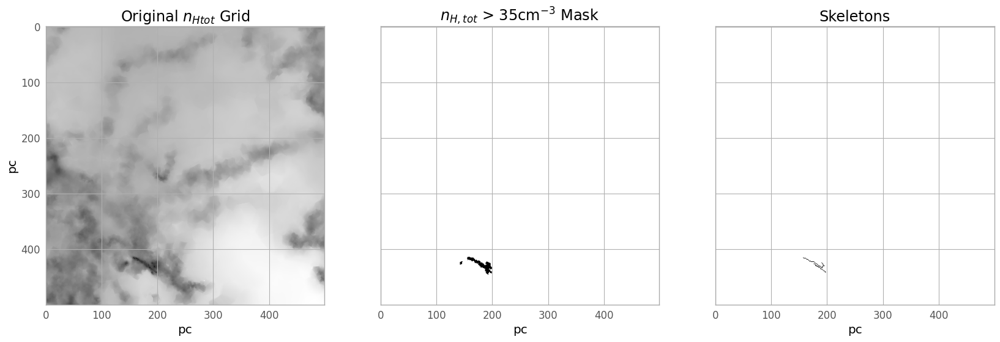

Grid : x1470y1400z1400 Axis = 1


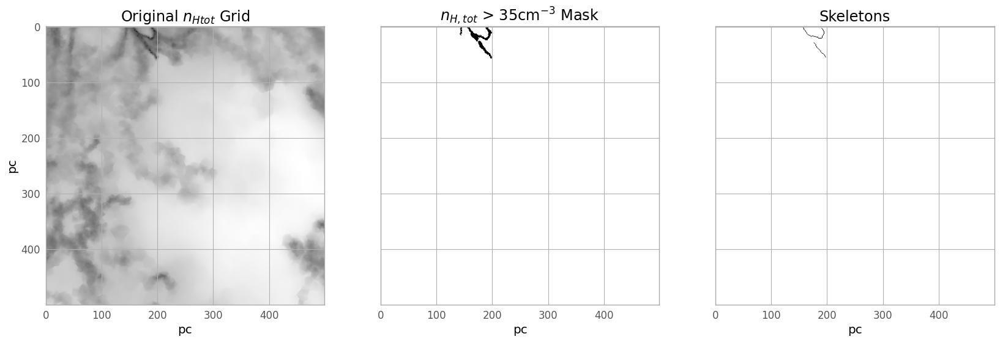

Grid : x1470y1400z1400 Axis = 2


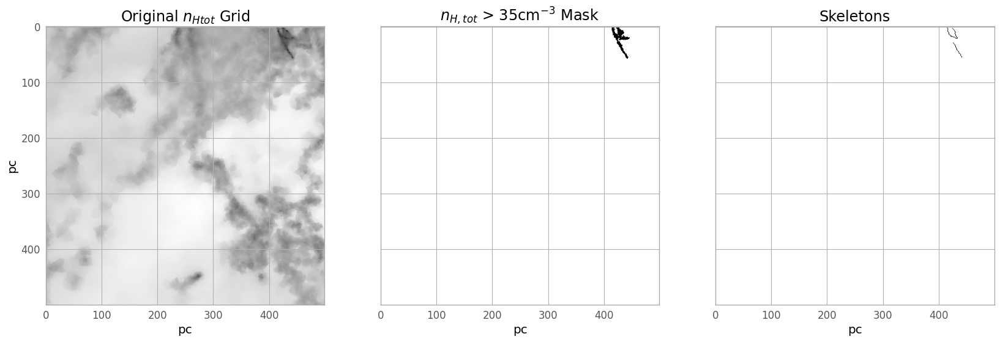

In [32]:
import matplotlib.pyplot as plt
import glob as glob
import numpy as np

# Set up plot stylization 
# Note that this plot style will mess up future gaussian graphs if the same notebook is run.
# Make sure to restart the kernel before rerunning the pipeline
from astropy.visualization import astropy_mpl_style
plt.style.use(astropy_mpl_style)
from matplotlib import rcParams
from matplotlib.patches import Rectangle

from astropy.io import fits
from astropy.utils.data import get_pkg_data_filename

# Title names 
grid_title = '$n_{H,tot}$'
threshold_level = 35
designation = 'x1470y1400z1400'

# Load in all the nhtot fits files
data_table = glob.glob('nhtot*.fits')
print('Make sure the indices when loading in the files match the loading in steps')
print(data_table)

# Axis to sum on
axis_array = [0,1,2]

for axis in axis_array:

    # Load in the grid 
    image_file = get_pkg_data_filename(data_table[0])
    image_data = fits.getdata(data_table[0])
    image_data = np.sum(image_data,axis=axis)
    image_data_sim = image_data

    # Load in the mask 
    image_file = get_pkg_data_filename(data_table[1])
    image_data = fits.getdata(image_file, ext=0)
    image_data = np.sum(image_data,axis=axis)
    image_data[image_data !=0] = 1
    image_data_mask = image_data

    # Load in the skeleton
    image_file = get_pkg_data_filename(data_table[2])
    image_data = fits.getdata(image_file, ext=0)
    image_data = np.sum(image_data,axis=axis)
    image_data[image_data !=0] = 1
    image_data_skeleton = image_data

    fig, (ax1, ax2, ax3) = plt.subplots(1,3, sharex=True, sharey=True, figsize = (20,15))

    print('Grid : ' + designation + ' Axis = ' + str(axis))

    ax1.imshow(np.log10(image_data_sim),  cmap='gray_r')
    ax1.set_xlabel('pc')
    ax1.set_ylabel('pc')
    string = 'Original ' + grid_title + ' Grid'
    ax1.set_title('Original $n_{Htot}$ Grid')

    ax2.imshow(image_data_mask,  cmap='gray_r')
    ax2.set_xlabel('pc')
    string = grid_title + ' > ' + str(threshold_level) +  'cm$^{-3}$ Mask'
    ax2.set_title(string)

    ax3.imshow(image_data_skeleton,  cmap='gray_r')
    ax3.set_xlabel('pc')
    ax3.set_title('Skeletons')

    plt.show()

# 2. Finding Star-Forming Sinks

To find the number of sinks, you first have to grab the .npy file for sink locations from Star-Forming-Sink-Files and put in the same folder as this notebook. 

Please note that the numpy array for sinks is made to display correctly when the plots below are summed over axis =1. Otherwise, the projection will be off in the figure.

a. First show the entire grid skeletons, masked clouds, and sinks

In [17]:
#

skeleton_string = 'nhtot_x1470y1400z1400_35_skeleton.fits'
coord_string = 'x1470y1400z1400'
mask_string = 'nhtot_' + coord_string + '_35_thresholded_data.fits'
sink_string = coord_string + '_sinks.npy'

# Load in masks
image_file = get_pkg_data_filename(mask_string)
image_data = fits.getdata(image_file, ext=0)
image_data = np.sum(image_data,axis=axis)
image_data[image_data !=0] = 1
image_data_mask = image_data

# Load in skeleton 
image_file = get_pkg_data_filename(skeleton_string)
image_data = fits.getdata(image_file, ext=0)
image_data = np.sum(image_data,axis=axis)
image_data[image_data !=0] = 1
image_data_skeleton = image_data

# Load in sinks 
sink_image = np.zeros_like(image_data_mask)
sink_array = np.load(sink_string, allow_pickle = True).T

for i in sink_array:
    x = int(i[0])
    y = int(i[1])
    z = int(i[2])

    sink_image[x][z] = 1

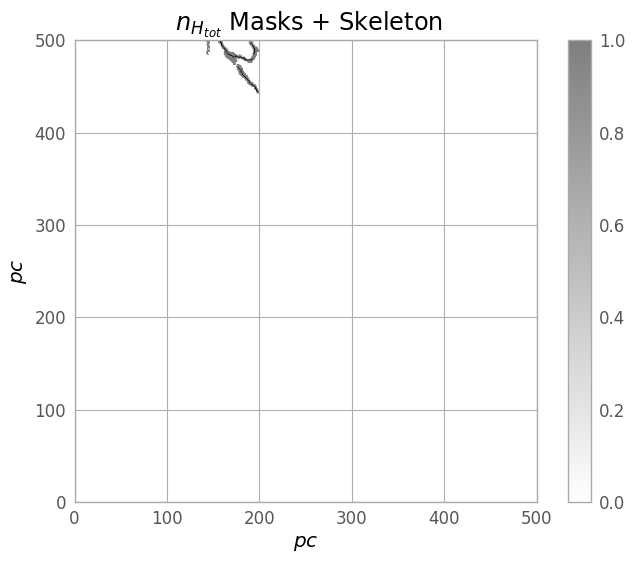

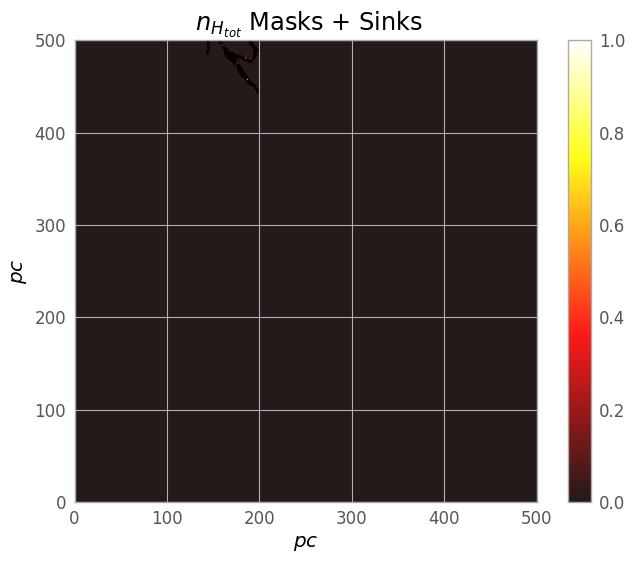

In [18]:
fig = plt.figure()
extent = 0, 500, 0, 500
im1 = plt.imshow(image_data_mask, cmap=plt.cm.gray_r, alpha = 1,
                 extent=extent)
im2 = plt.imshow(image_data_skeleton, cmap=plt.cm.gray_r, alpha = 0.5,
                 extent=extent)

plt.xlabel('$pc$')
plt.ylabel('$pc$')
plt.colorbar()
plt.title(' $n_{H_{tot}}$ Masks + Skeleton')
plt.show()

fig = plt.figure()
extent = 0, 500, 0, 500
im1 = plt.imshow(image_data_mask, cmap=plt.cm.gray_r, alpha = 1,
                 extent=extent)

im3 = plt.imshow(sink_image, cmap=plt.cm.hot,  alpha = 0.9,
                 extent=extent)
plt.xlabel('$pc$')
plt.ylabel('$pc$')
plt.colorbar()
plt.title(' $n_{H_{tot}}$ Masks + Sinks')
plt.show()

b. Count how many sinks is in each cloud and save in a table

-------------------------------------
-------------------------------------
x1470y1400z1400
-------------------------------------
-------------------------------------


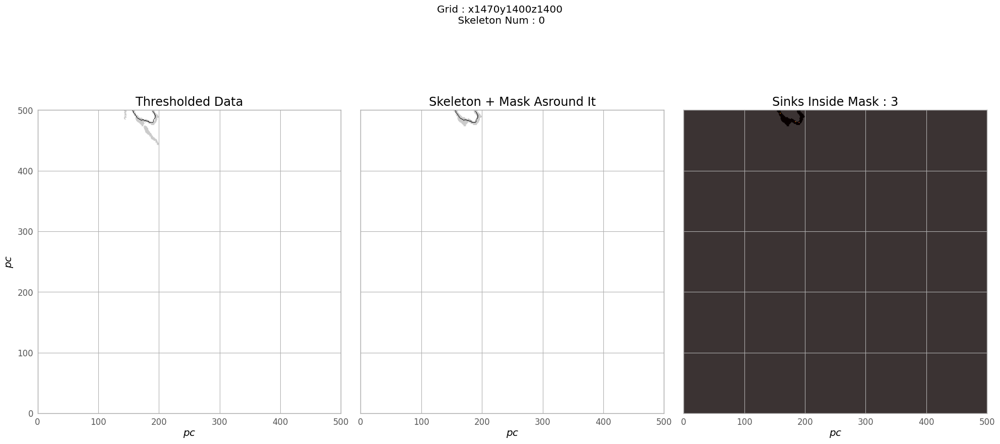

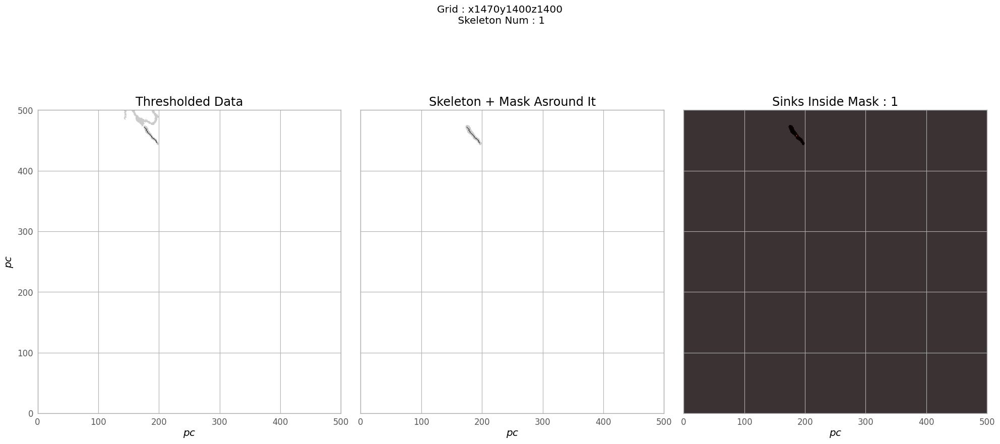

idx,Designation,Skeleton Index,# Sinks
0,x1470y1400z1400,0,3
1,x1470y1400z1400,1,1


In [35]:
from skimage.morphology import flood    
import skimage.morphology as mo
from skimage.segmentation import flood, flood_fill
from astropy.table import Table, hstack

# Set up table
names = ('Designation', 'Skeleton Index', '# Sinks')
dtype = ('S2', 'int32', 'int32')
t = Table(names=names,dtype=dtype)

# Load in files
skeleton_string = 'nhtot_x1470y1400z1400_35_skeleton.fits'
coord_string = 'x1470y1400z1400'
mask_string = 'nhtot_' + coord_string + '_35_thresholded_data.fits'
sink_string = coord_string + '_sinks.npy'
skeleton_array_string = 'nhtot_' + coord_string + '_35_skeleton_array.npy'

print('-------------------------------------')
print('-------------------------------------')
print(coord_string)
print('-------------------------------------')
print('-------------------------------------')

# Load in masks
image_file = get_pkg_data_filename(mask_string)
image_data = fits.getdata(image_file, ext=0)

# Load in the skeletons 
skeletons = np.load(skeleton_array_string, allow_pickle = True)

# Create the masked data 
thresholded_data = image_data
thresholded_data =  thresholded_data.byteswap().newbyteorder()

# Loop over skeletons 
for skeleton_num in range(len(skeletons)):
    skeleton_1 = skeletons[skeleton_num]
    index = -1

    for i in range(len(skeleton_1[0])):
        
        x = skeleton_1[0][i]
        y = skeleton_1[1][i]
        z = skeleton_1[2][i]

        if thresholded_data[x][y][z] == 0:
            continue
        elif thresholded_data[x][y][z] == 1:
            index = i
            break

    if index == -1:
        print('Skeleton not in any filled point')
        # will have to use find_closest

    # Flood to find the mask that contains the skeleton
    skeleton_point = (skeleton_1[0][index], skeleton_1[1][index], skeleton_1[2][index])
    mask_interim = flood(thresholded_data, skeleton_point, tolerance=0).astype(int)

    # Smooth the mask 
    # Fill in small holes useing dilation and closing 
    ball_size = 1.5
    selem = mo.ball(ball_size)
    mask_final = mo.dilation(mask_interim, selem)
    mask_final = mo.closing(mask_final)

    # Look for sinks in mask final
    mask_final_coord = np.where(mask_final ==1)
    mask_final_coord_array = []

    for i in range(len(mask_final_coord[0])):
        x = mask_final_coord[0][i]
        y = mask_final_coord[1][i]
        z = mask_final_coord[2][i]

        mask_final_coord_array.append([x,y,z])

    sink_array = np.load(sink_string, allow_pickle = True).T

    sinks_in_mask = []
    sink_counter = 0

    for i in range(len(sink_array)):
        
        x = int(sink_array[i][0])
        y = int(sink_array[i][1])
        z = int(sink_array[i][2])

        if [x,y,z] in mask_final_coord_array:
            sinks_in_mask.append([x,y,z])
            sink_counter += 1

    #################################################
    # Plot for sanity check

    axis = 1

    thresholded_data_2d = np.sum(thresholded_data,axis=axis)
    thresholded_data_2d[thresholded_data_2d !=0] = 1

    mask_data = np.sum(mask_final,axis=axis)
    mask_data[mask_data !=0] = 1

    # Load in skeleton
    skeleton_image = np.zeros_like(mask_data)

    for i in range(len(skeleton_1[0])):
        x = skeleton_1[0][i]
        y = skeleton_1[1][i]
        z = skeleton_1[2][i]
        skeleton_image[x][z] = 1

    # Load in sinks 
    sink_image = np.zeros_like(mask_data)

    for i in range(len(sinks_in_mask)):
        x = sinks_in_mask[i][0]
        y = sinks_in_mask[i][1]
        z = sinks_in_mask[i][2]
        sink_image[x][z] = 1

    fig, (ax1, ax2, ax3) = plt.subplots(1,3, sharex=True, sharey=True, figsize = (20,10))

    suptitle = 'Grid : ' + coord_string + '\n Skeleton Num : ' + str(skeleton_num)
    fig.suptitle(suptitle)
    extent = 0, 500, 0, 500

    im1 = ax1.imshow(thresholded_data_2d,  cmap=plt.cm.gray_r, extent = extent, alpha = 1)
    im2 = ax1.imshow(skeleton_image, cmap=plt.cm.gray_r, extent = extent, alpha = 0.8)
    ax1.set_xlabel('$pc$')
    ax1.set_ylabel('$pc$')
    ax1.set_title('Thresholded Data')

    im3 = ax2.imshow(mask_data, cmap=plt.cm.gray_r, extent = extent, alpha = 1)
    im4 = ax2.imshow(skeleton_image, cmap=plt.cm.gray_r, extent = extent, alpha = 0.8)
    ax2.set_xlabel('$pc$')
    ax2.set_title('Skeleton + Mask Asround It')

    im5 = ax3.imshow(mask_data, cmap=plt.cm.gray_r, extent = extent, alpha = 1)
    im6 = ax3.imshow(sink_image, cmap=plt.cm.hot, extent = extent, alpha = 0.8)
    ax3.set_xlabel('$pc$')
    title = 'Sinks Inside Mask : ' + str(sink_counter)
    ax3.set_title(title)

    fig.tight_layout()
    plt.show()

    # Add to table 
    table_row = [coord_string,skeleton_num,sink_counter]
    t.add_row(table_row)

file_name_save = 'Number_sinks_per_cloud'
t.write(file_name_save, overwrite=True,format='ascii', formats = {'Designation':'%s','Skeleton Index':'%d', '# Sinks':'%d'})
t.show_in_notebook()

# 3. Radial Profile Gifs 

This output product can give you a view of the actual structure of a cloud's radial profile. 

Each frame in the gif indicates the frame number, and the coordinate in the simulation that represents the 0,0 of the graph. 

A UV linear transformation is used to project the 3D slice onto a 2D plane. 

a. Lets look at the nhtot radial profile gifs for the first cloud. This cloud is on the edge of the grid, so part of its profile will be cut off 

Number of frames: 58
Showing 5 frames :  [ 0.   14.25 28.5  42.75 57.  ]


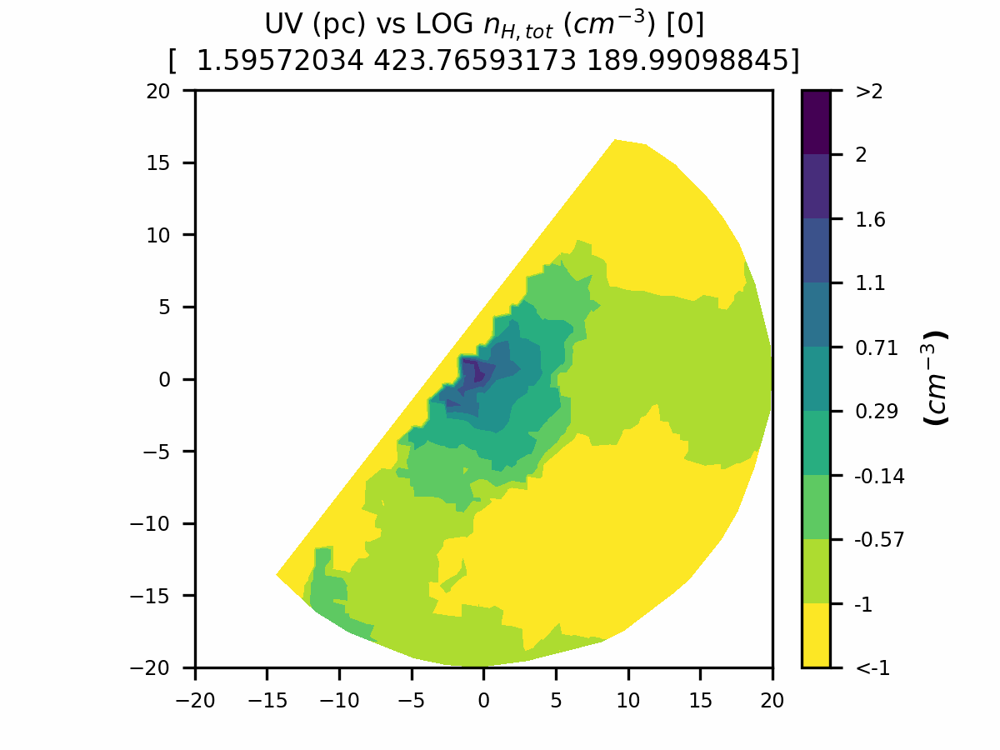

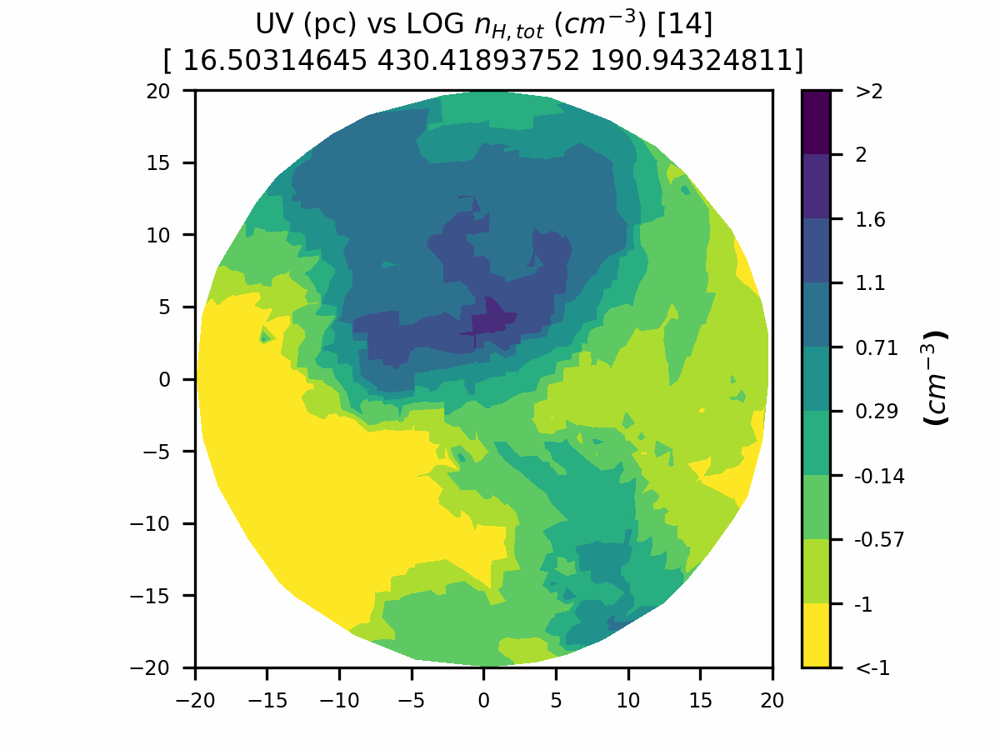

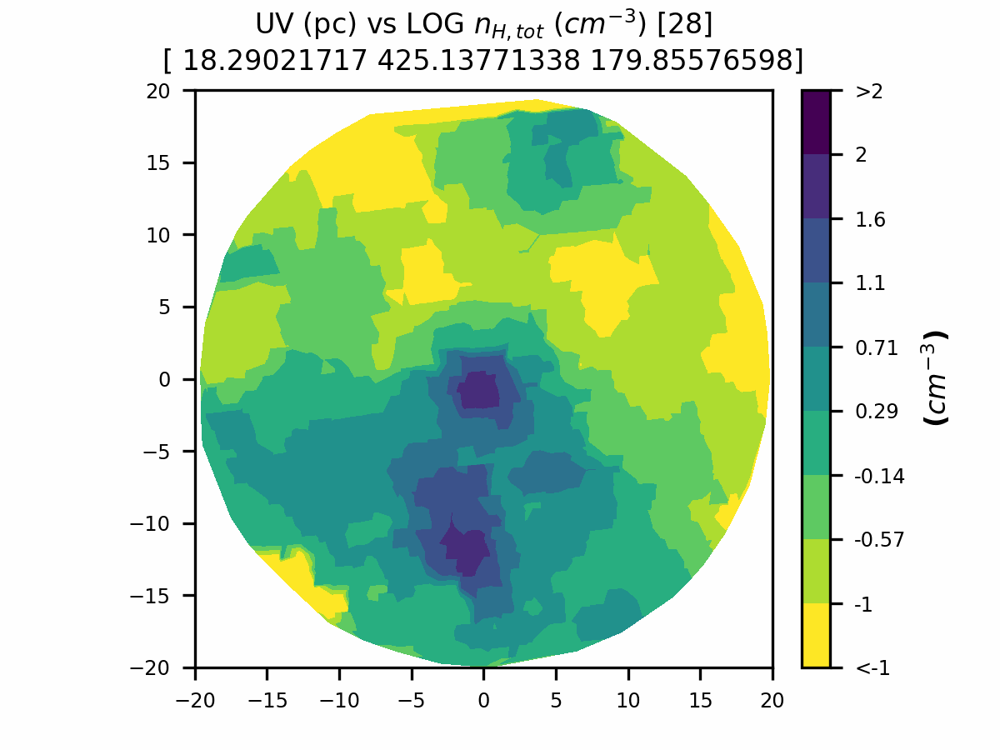

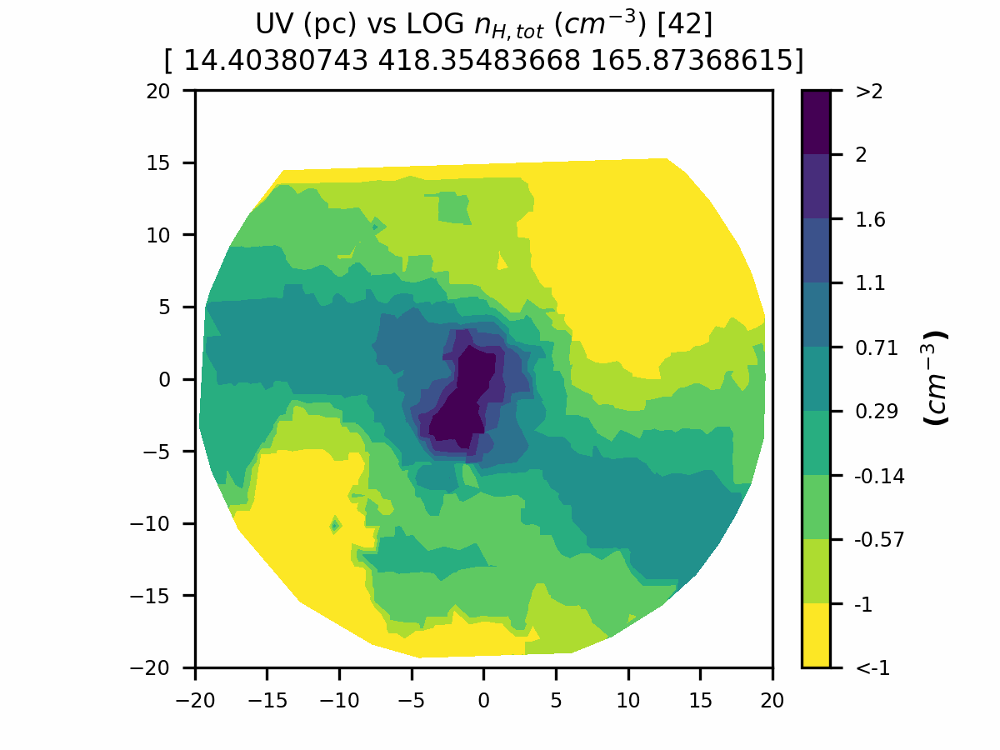

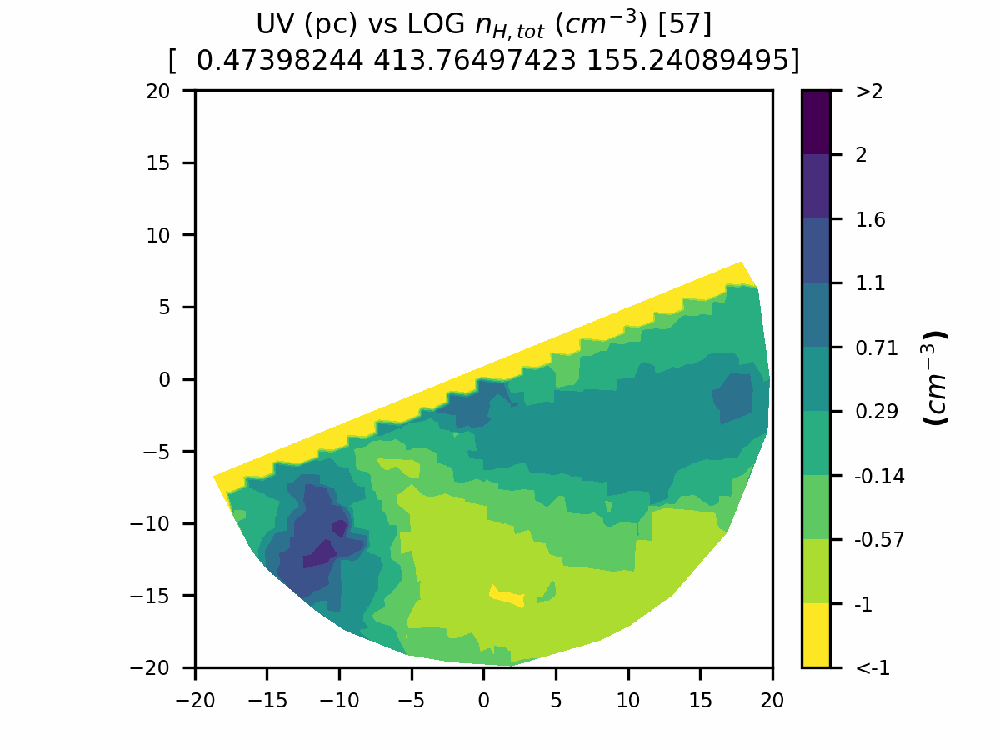

In [37]:
from PIL import Image
import matplotlib.pyplot as plt

# Title names 
grid_type = 'nht'
tracer = 'nhtot'
threshold_level = 35
designation = 'x1470y1400z1400'

cloud_number = 0 

gif_file_name = './' + grid_type + '_' + str(threshold_level) + '_' + designation + '_LOG_' + tracer + '_animation_' + str(cloud_number) + '.gif'
im = Image.open(gif_file_name)

print("Number of frames: " +str(im.n_frames))

frames = np.linspace(0,im.n_frames-1,5)

print('Showing 5 frames : ', frames)

for frame in frames:
    im = Image.open(gif_file_name)
    frame = int(frame)
    im.seek(frame)
    display(im)

Now lets look at every available tracer at one point in the cloud. Lets do point 28

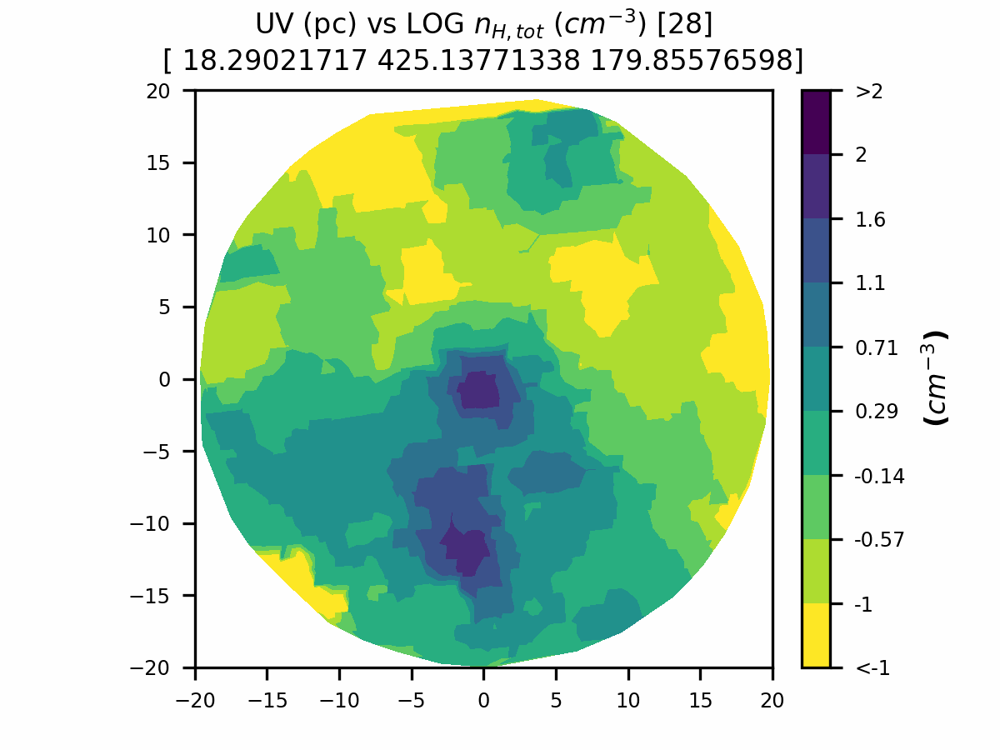

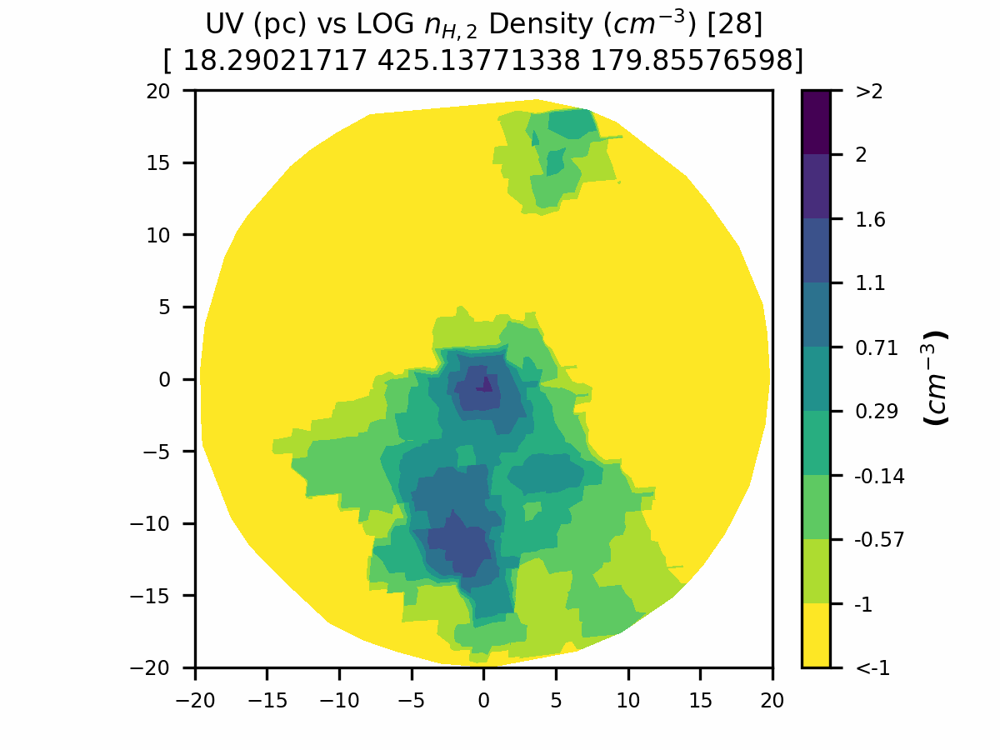

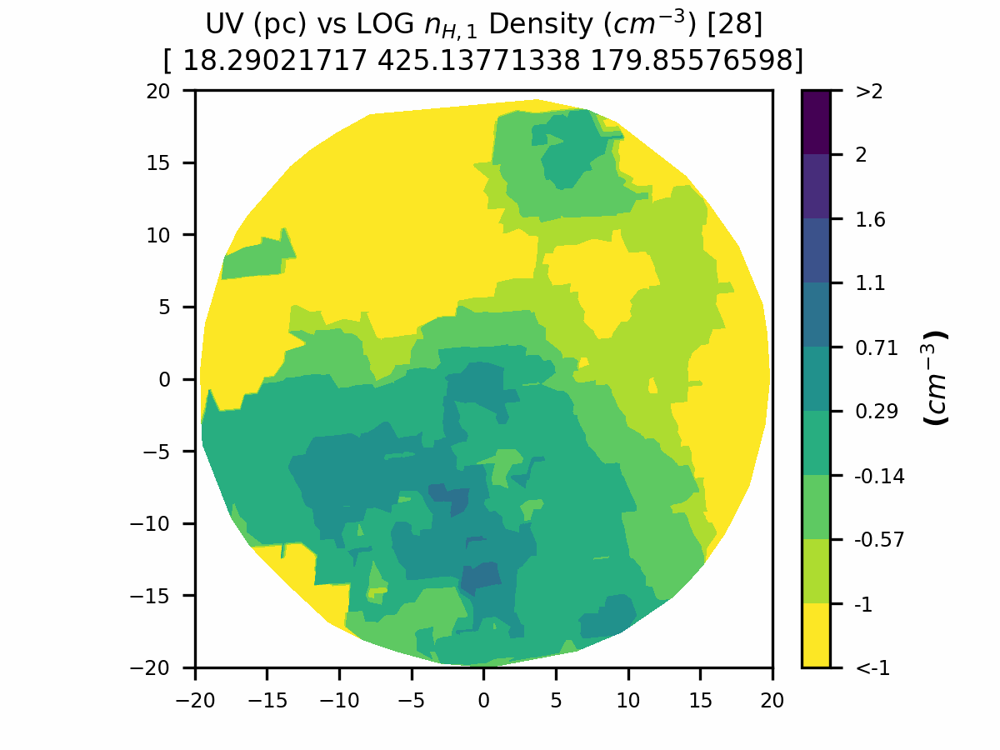

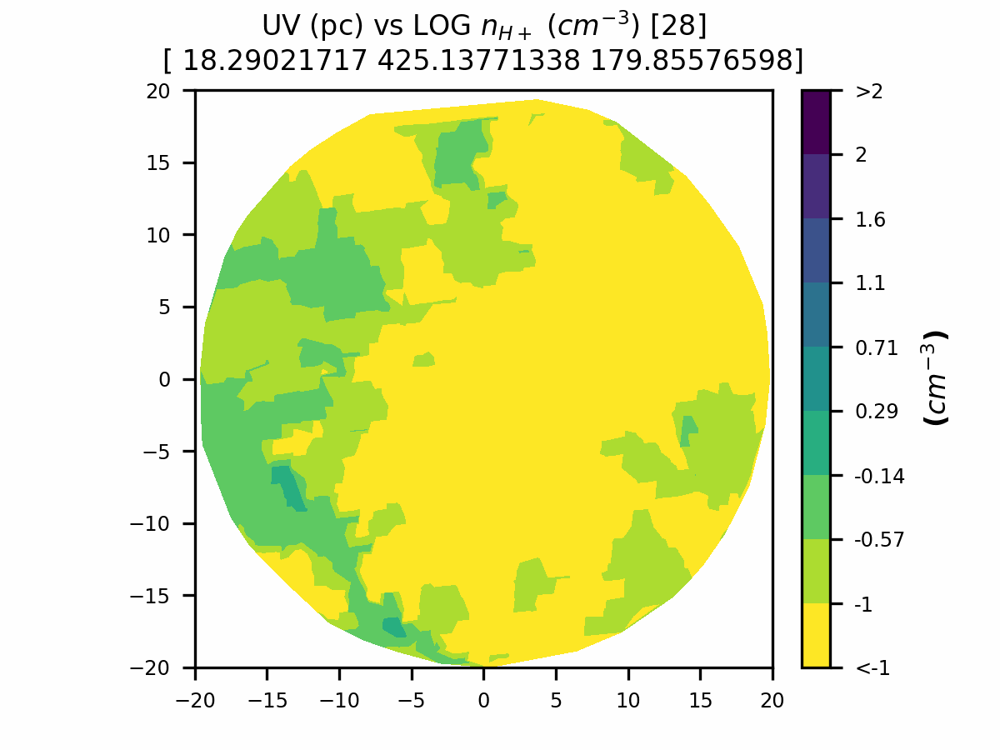

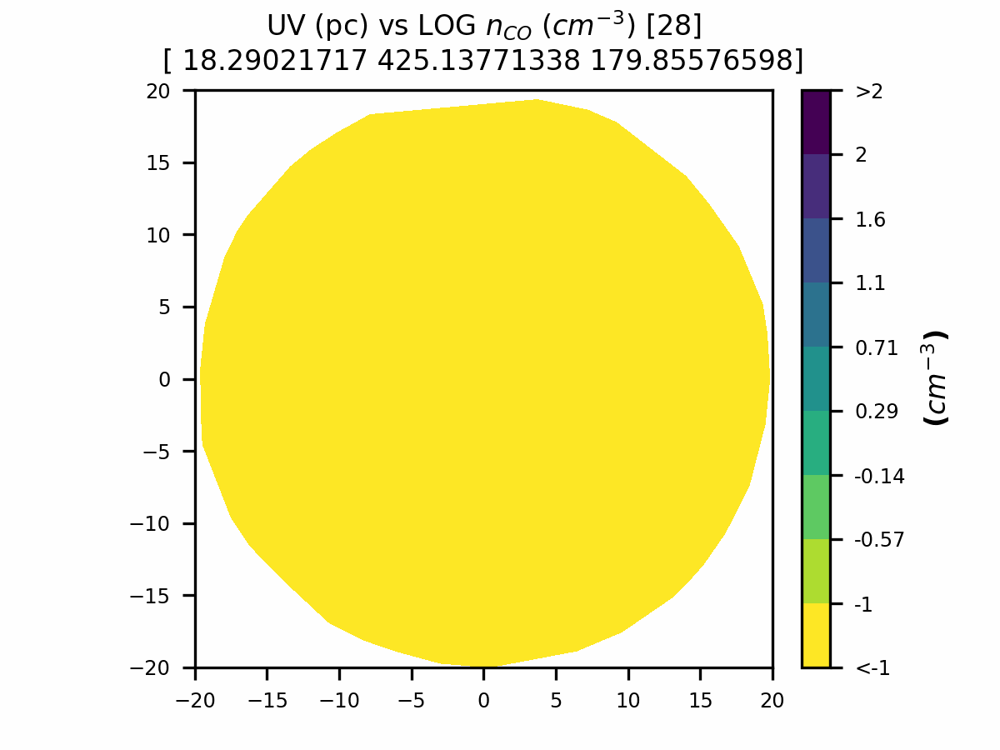

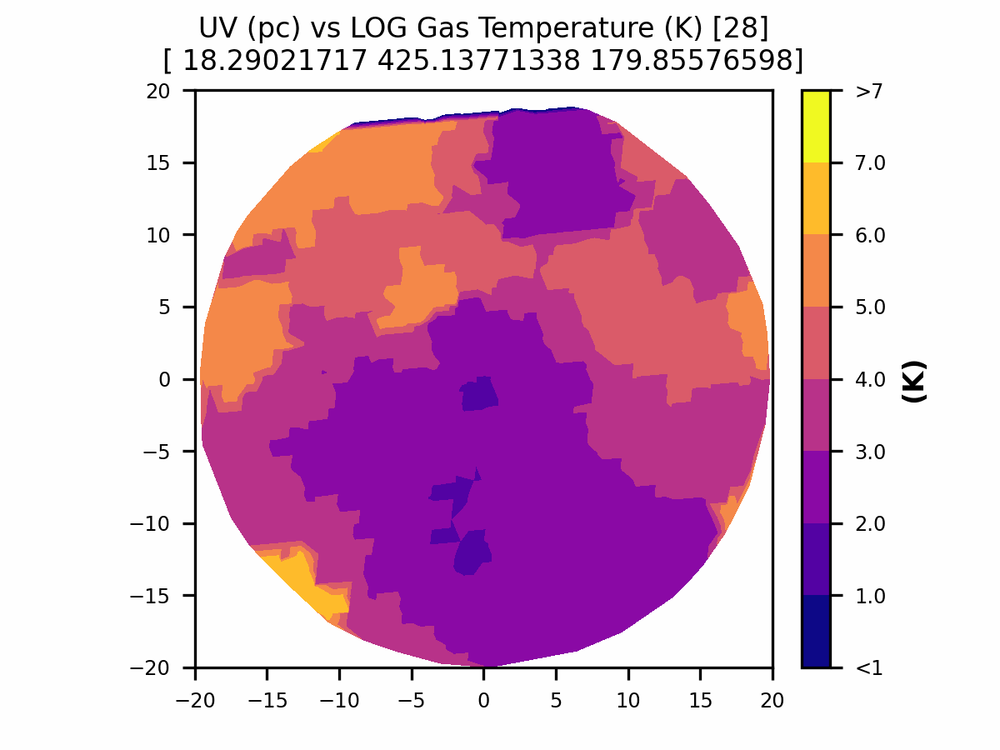

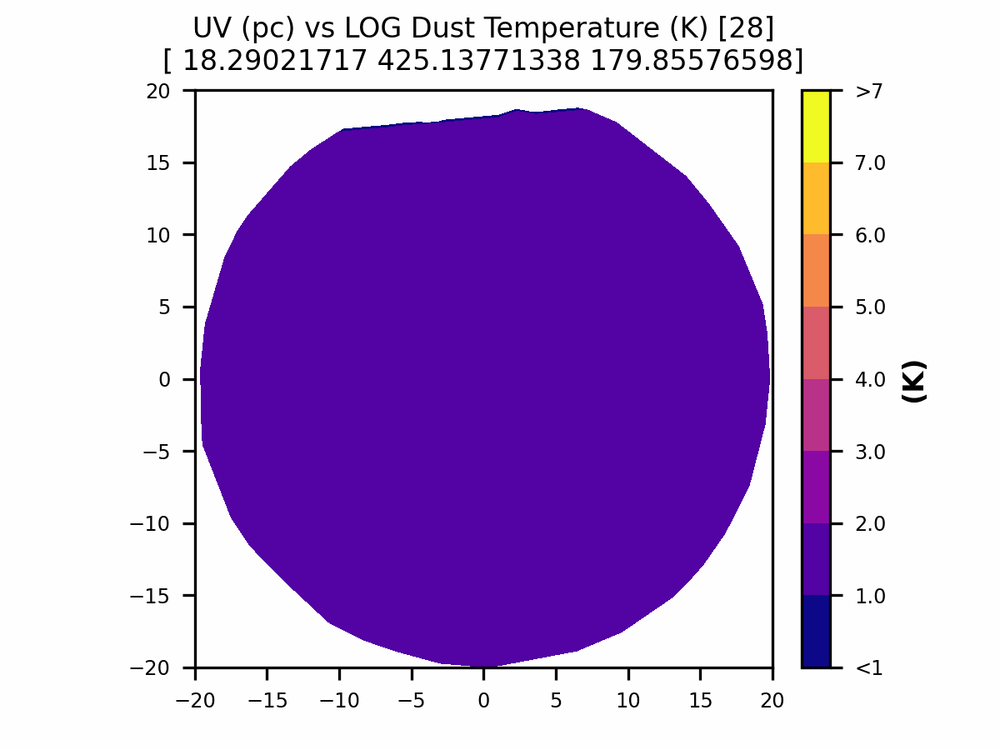

In [38]:
from PIL import Image
import matplotlib.pyplot as plt

# Title names 
grid_type = 'nht'
tracers = ['NHTOT', 'NH2', 'NH1', 'NHP','NCO','GAS_TEMP', 'DUST_TEMP']
threshold_level = 35
designation = 'x1470y1400z1400'
frame = 28

cloud_number = 0 

for tracer in tracers:

    gif_file_name = './' + grid_type + '_' + str(threshold_level) + '_' + designation + '_LOG_' + tracer + '_animation_' + str(cloud_number) + '.gif'
    im = Image.open(gif_file_name)
    im.seek(frame)
    display(im)

We can do the same for the second skeleton, which is not on the edge of the grid

Number of frames: 28
Showing 5 frames :  [ 0.    6.75 13.5  20.25 27.  ]


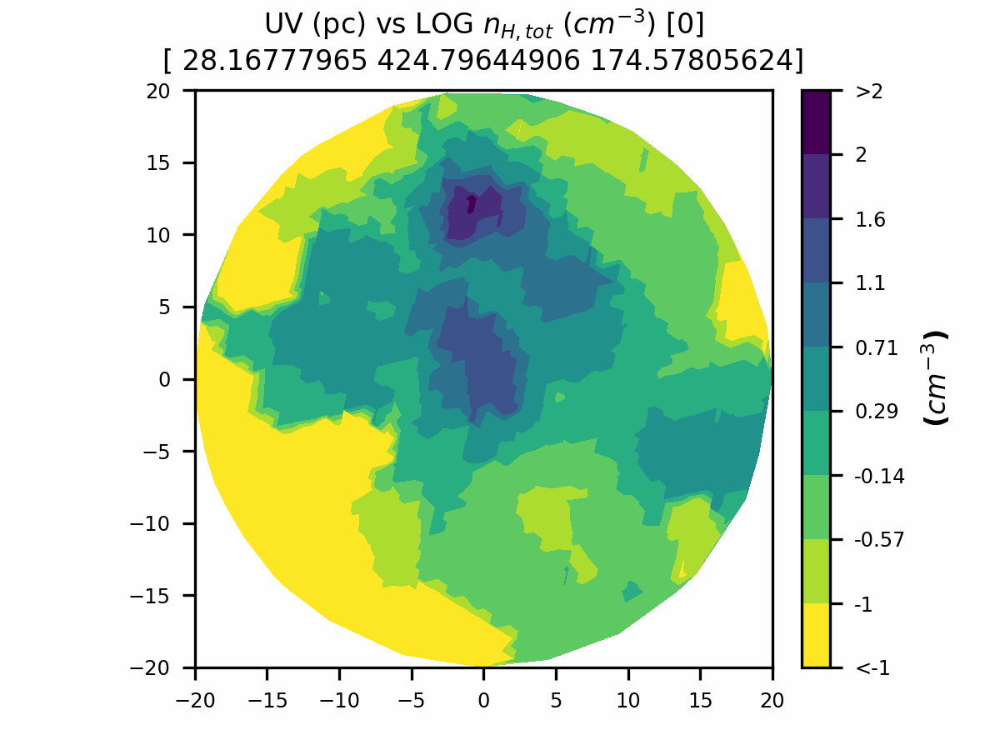

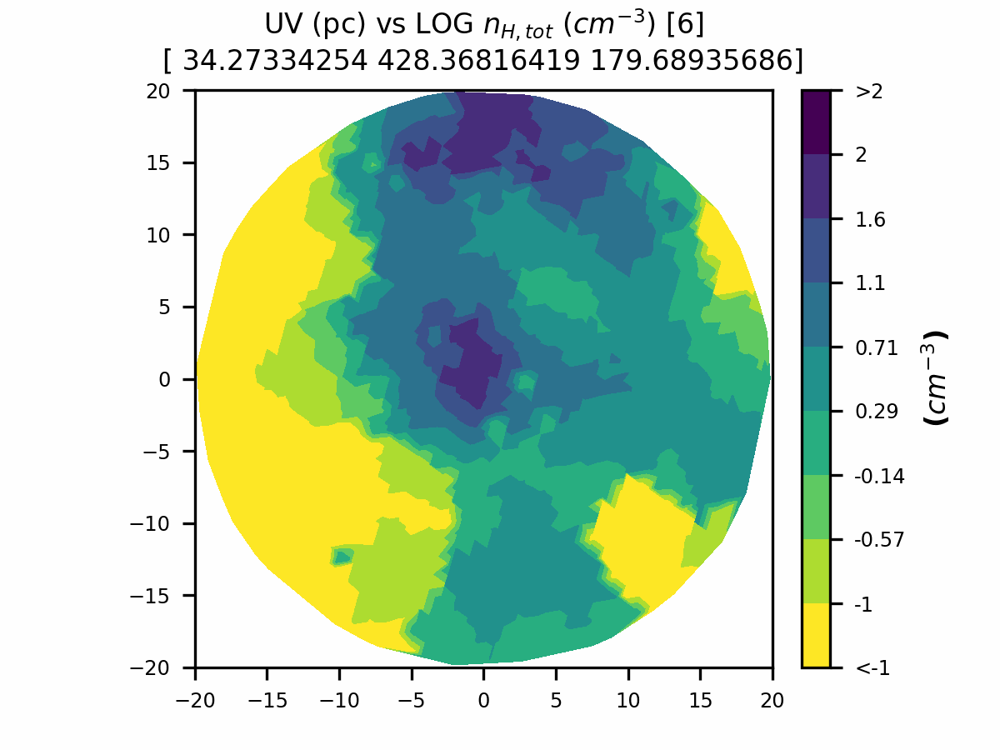

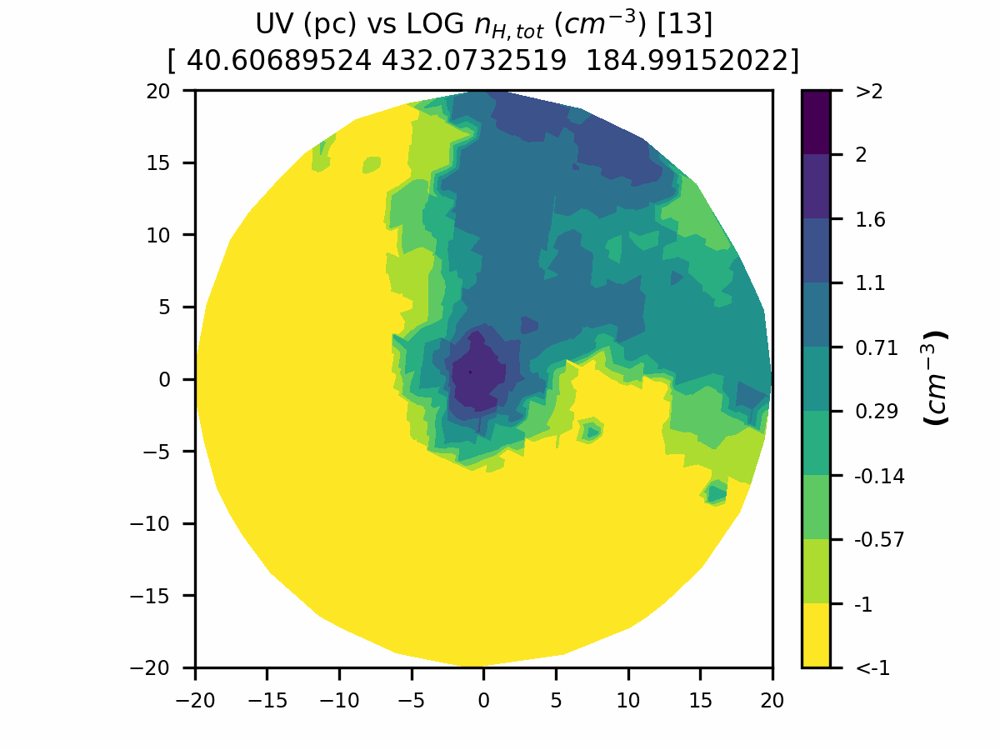

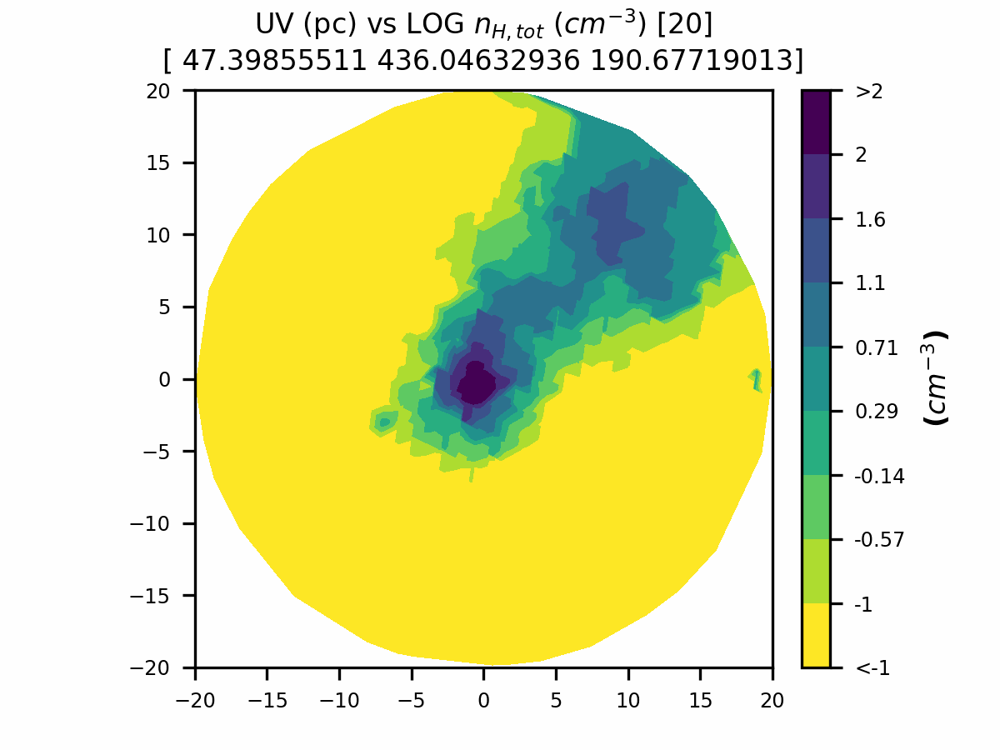

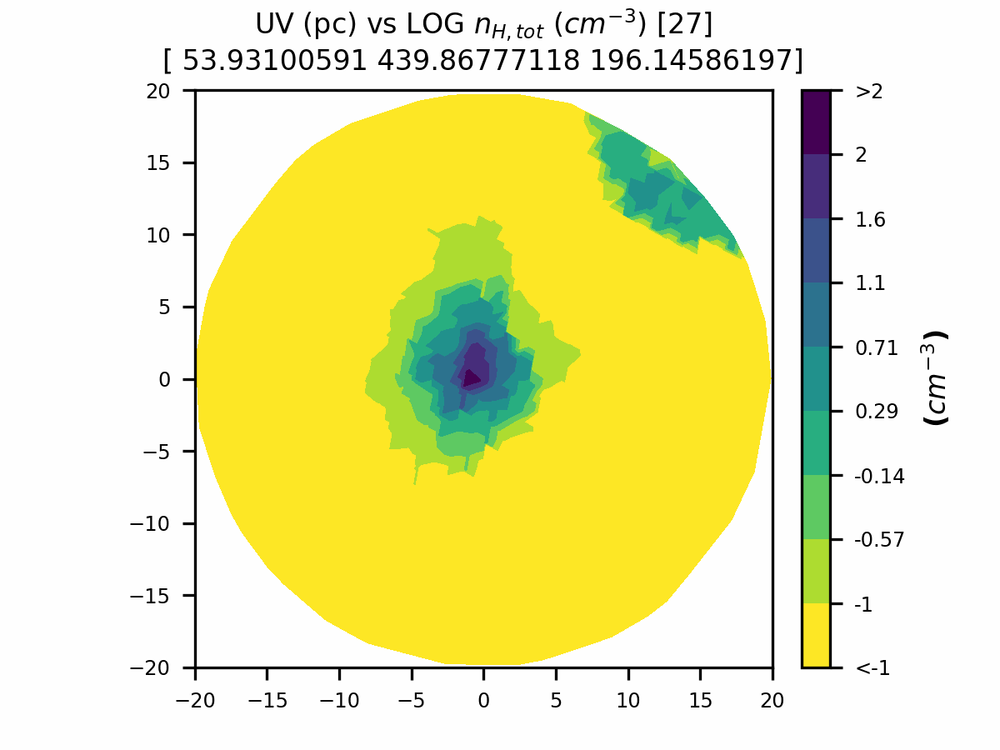

In [39]:
from PIL import Image
import matplotlib.pyplot as plt

# Title names 
grid_type = 'nht'
tracer = 'nhtot'
threshold_level = 35
designation = 'x1470y1400z1400'

cloud_number = 1

gif_file_name = './' + grid_type + '_' + str(threshold_level) + '_' + designation + '_LOG_' + tracer + '_animation_' + str(cloud_number) + '.gif'
im = Image.open(gif_file_name)

print("Number of frames: " +str(im.n_frames))

frames = np.linspace(0,im.n_frames-1,5)

print('Showing 5 frames : ', frames)

for frame in frames:
    im = Image.open(gif_file_name)
    frame = int(frame)
    im.seek(frame)
    display(im)

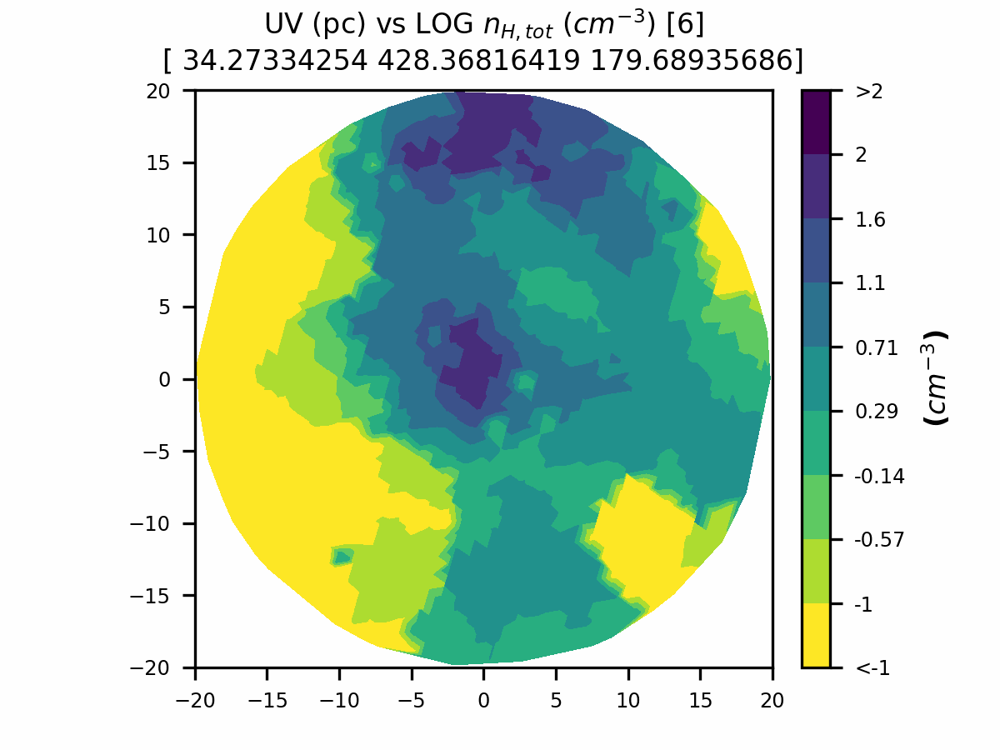

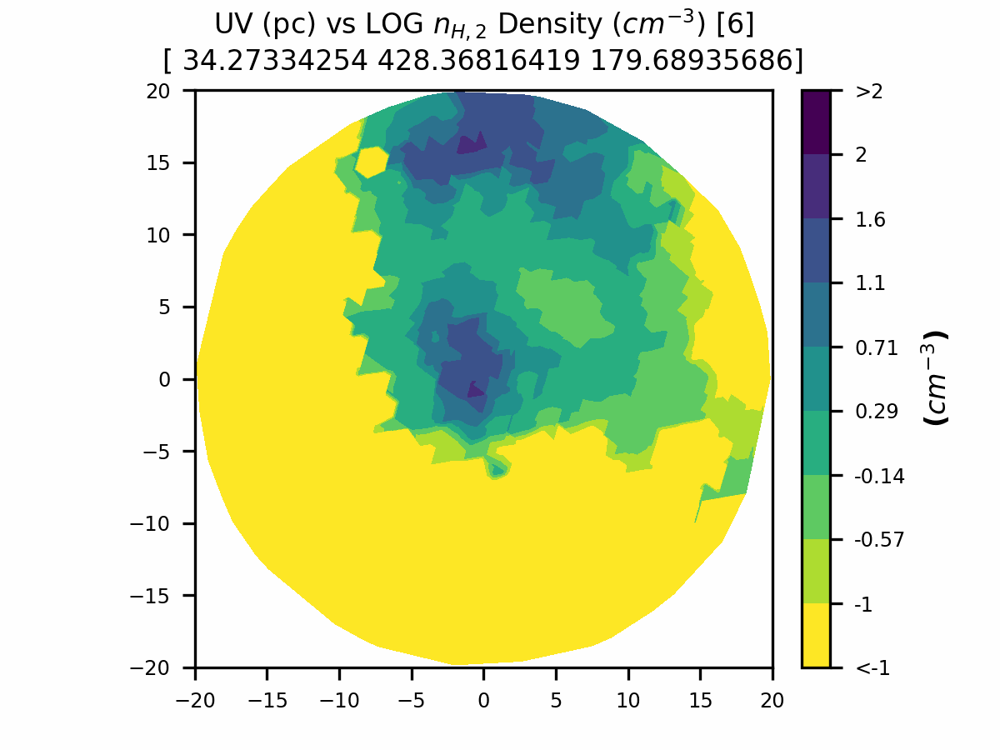

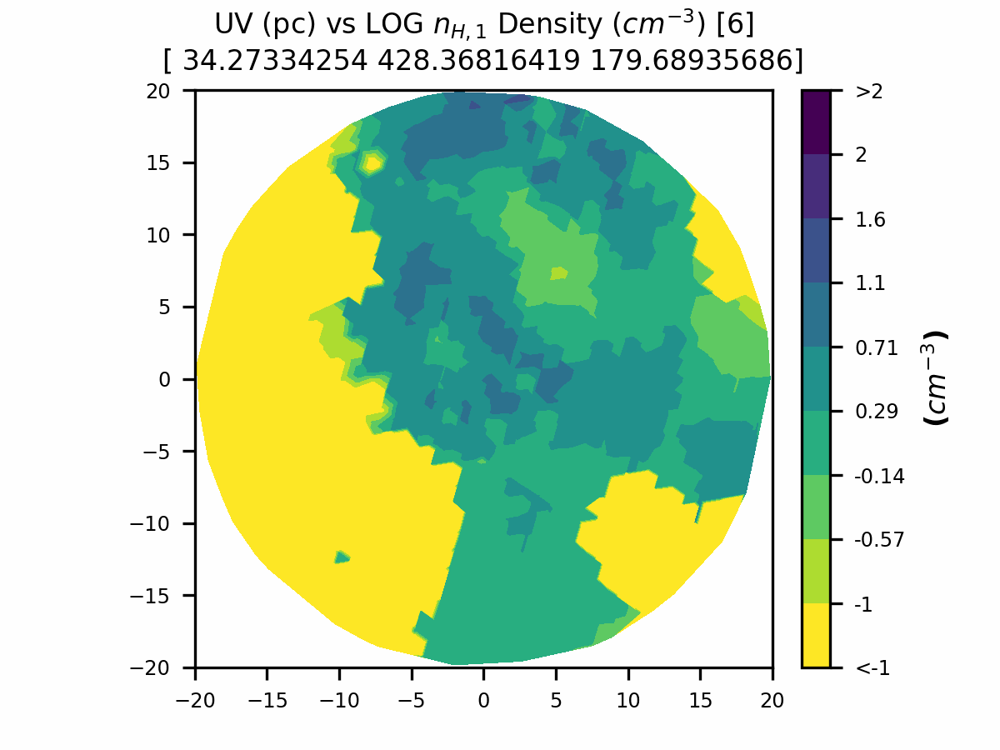

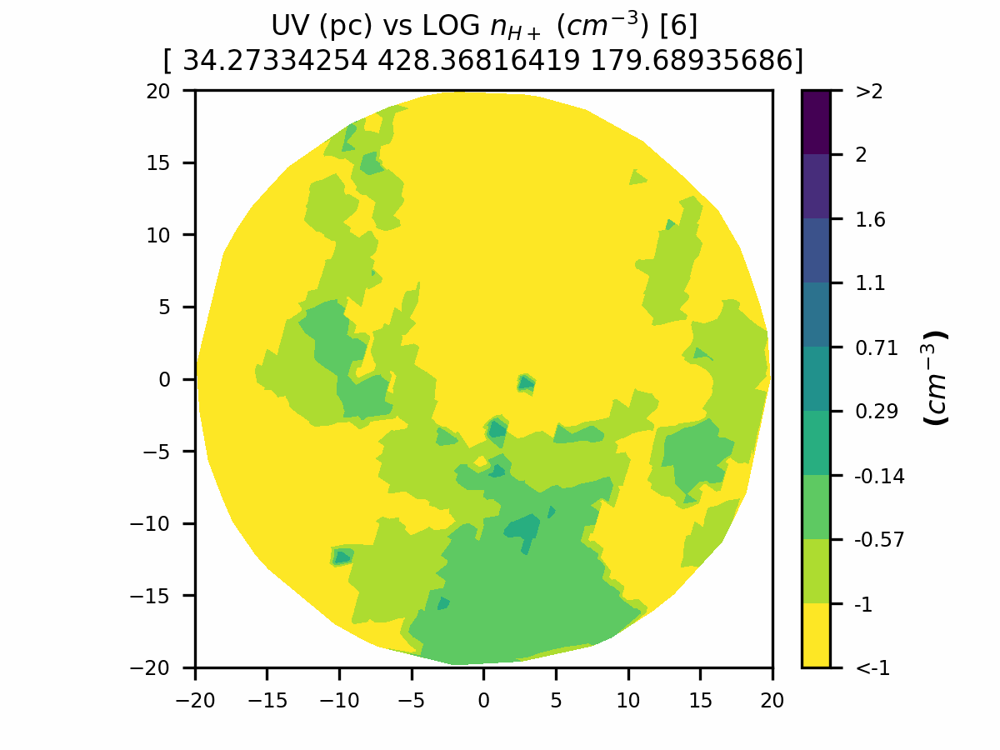

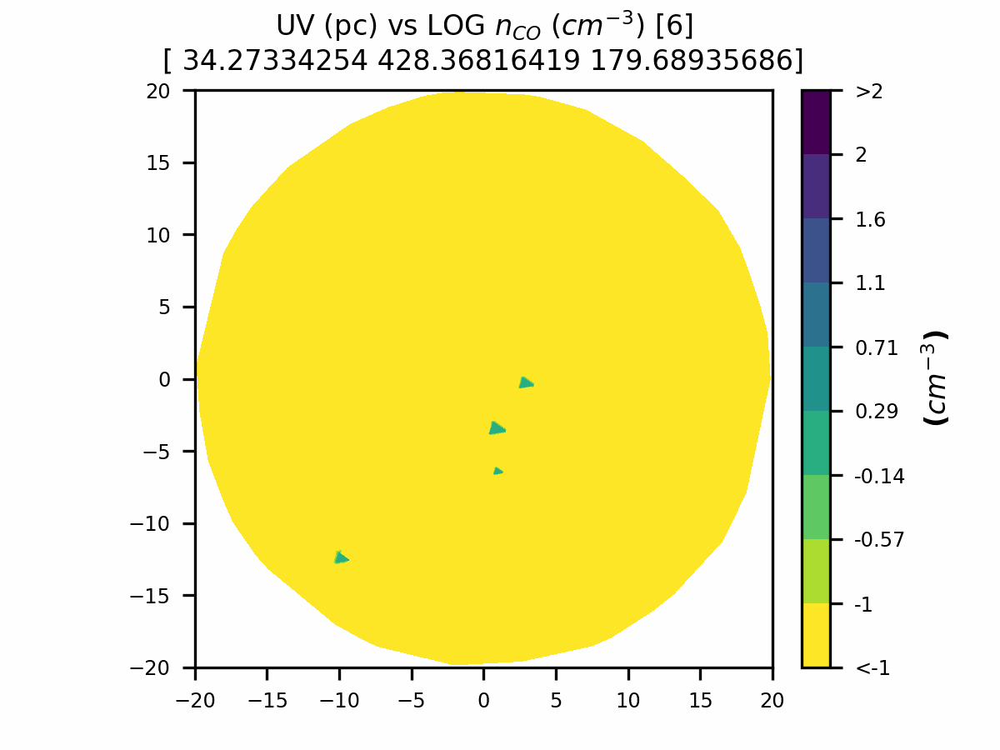

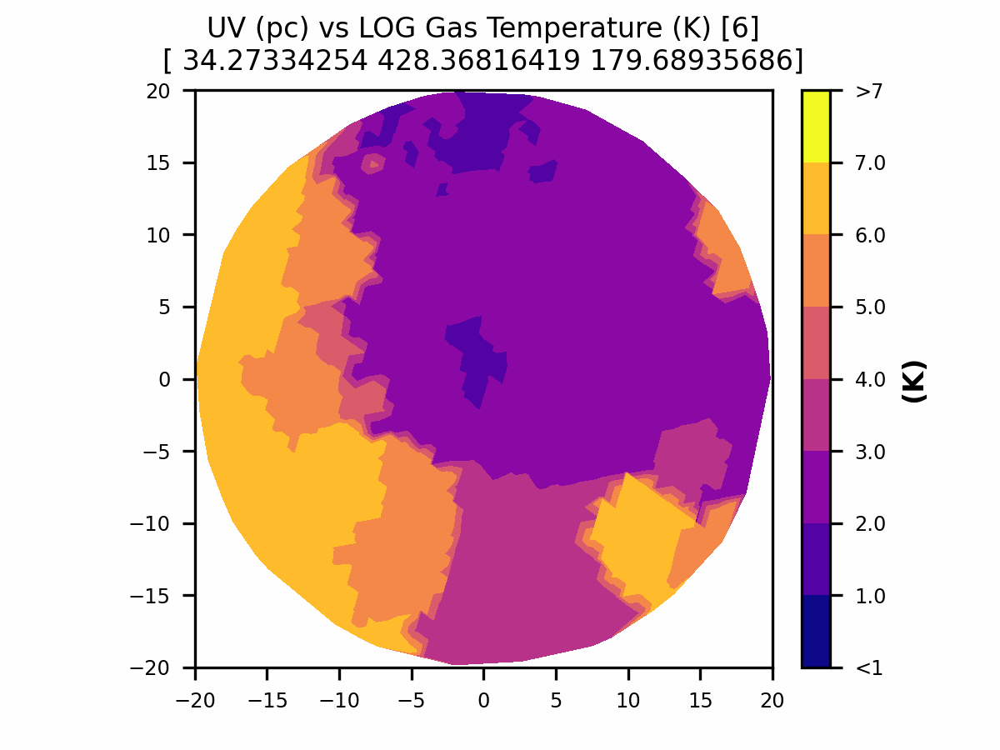

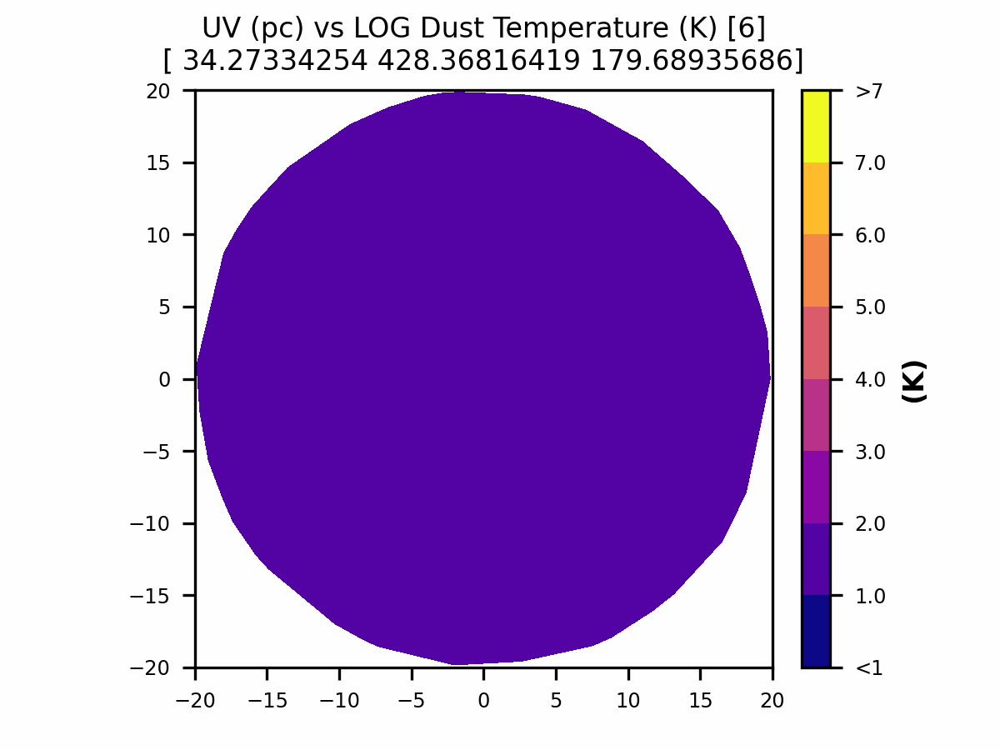

In [41]:
from PIL import Image
import matplotlib.pyplot as plt

# Title names 
grid_type = 'nht'
tracers = ['NHTOT', 'NH2', 'NH1', 'NHP','NCO','GAS_TEMP', 'DUST_TEMP']
threshold_level = 35
designation = 'x1470y1400z1400'
frame = 6

cloud_number = 1

for tracer in tracers:

    gif_file_name = './' + grid_type + '_' + str(threshold_level) + '_' + designation + '_LOG_' + tracer + '_animation_' + str(cloud_number) + '.gif'
    im = Image.open(gif_file_name)
    im.seek(frame)
    display(im)

# 4. Radial Profile Fits 

There are three pdfs available with the fit gaussians to the radial profiles of each cloud.

1. Regular gaussian, with no skeleton points excluded from analysis 
2. A gaussian where radial profiles with skeleton points with densities less than threshold_core (= 190) are exluded from the fit. 
3. A gaussian where radial profiles skeleton points with densities less than threshold_core (= 190) are exluded from the fits, and the inner two parsecs are not included in the fit (consistent with Zucker2021)

Lets look at all the information available in these pdfs. For this analysis, I will focus on the Zucker 2021 outputs since they are the most up to date and consistent with Zucker 2021 and Mullens 2023.

a. Loading in the pdfs as images

 (NOTE : To convert the pdf to jpegs, you need to install pdf2image and poppler via https://github.com/Belval/pdf2image, however for this tutorial they have already been converted, so the next step can be skipped)

In [58]:
# import module
from pdf2image import convert_from_path
 
# Store Pdf with convert_from_path function
images = convert_from_path('./nht_35_x1470y1400z1400_skeleton_0_gaussian_graphs_paper_core_thresholded_35_Zucker2021.pdf')
 
for i in range(len(images)):
   
      # Save pages as images in the pdf
    images[i].save('./pdf_pages_cloud_0/page'+ str(i) +'.jpg', 'JPEG')

In [47]:
# import module
from pdf2image import convert_from_path
 
# Store Pdf with convert_from_path function
images = convert_from_path('./nht_35_x1470y1400z1400_skeleton_1_gaussian_graphs_paper_core_thresholded_35_Zucker2021.pdf')
 
for i in range(len(images)):
   
      # Save pages as images in the pdf
    images[i].save('./pdf_pages_cloud_1/page'+ str(i) +'.jpg', 'JPEG')

b. Loading in the temperature profile fits. The Zucker2021 mode does both a sigmoid and spline fit to the temeprature profiles. The spline fit is used to determine the transition temperatures since clouds can be asymmetric

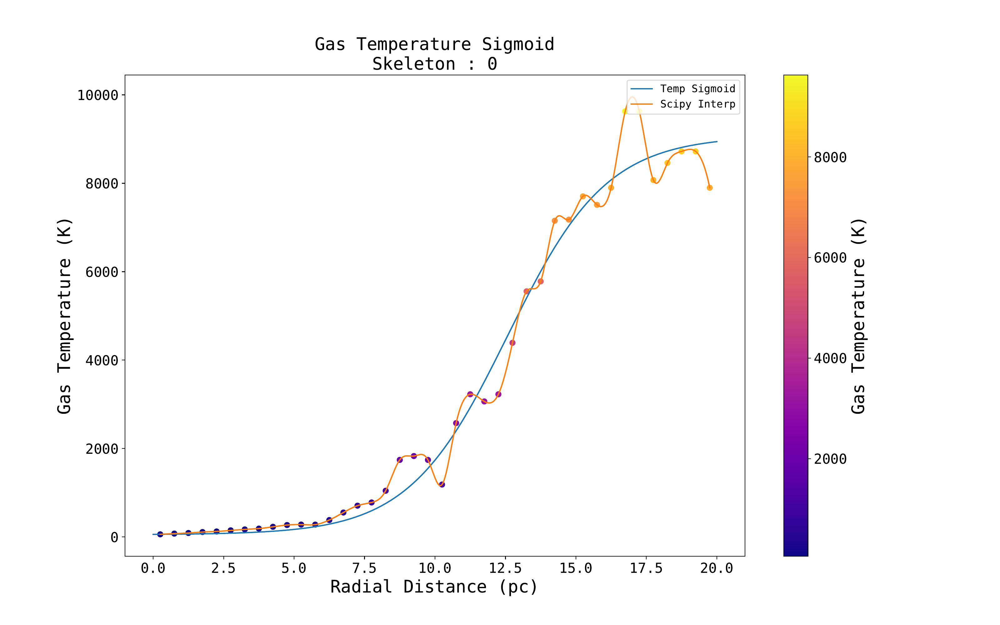

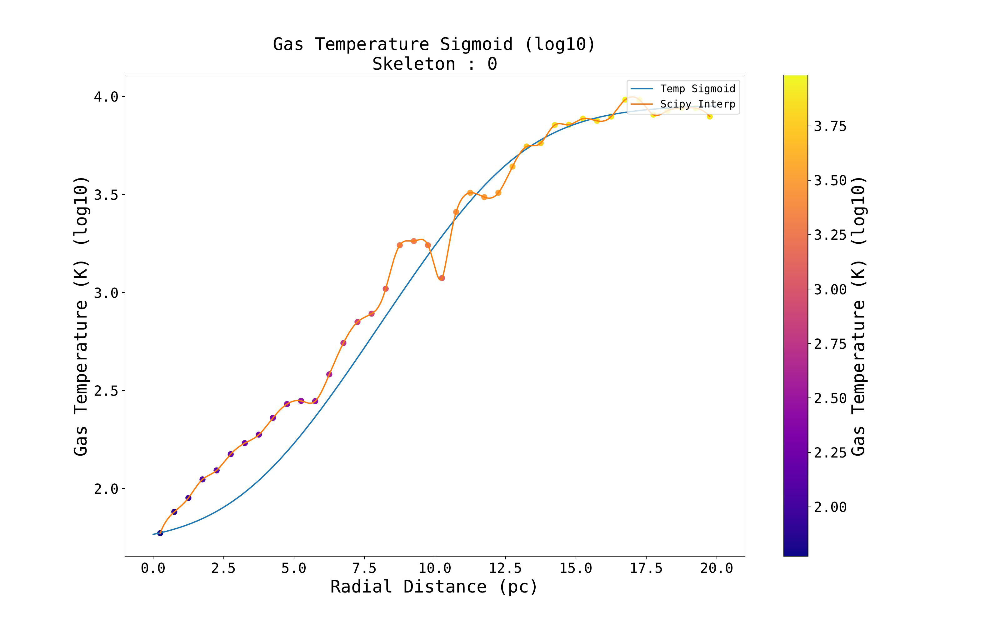

In [51]:
from PIL import Image
import matplotlib.pyplot as plt

cloud_number = 0
page_number = 0

file_name = './pdf_pages_cloud_'+ str(cloud_number) + '/page' + str(page_number) + '.jpg'
im = Image.open(file_name)
display(im)

page_number = 1
file_name = './pdf_pages_cloud_'+ str(cloud_number) + '/page' + str(page_number) + '.jpg'
im = Image.open(file_name)
display(im)


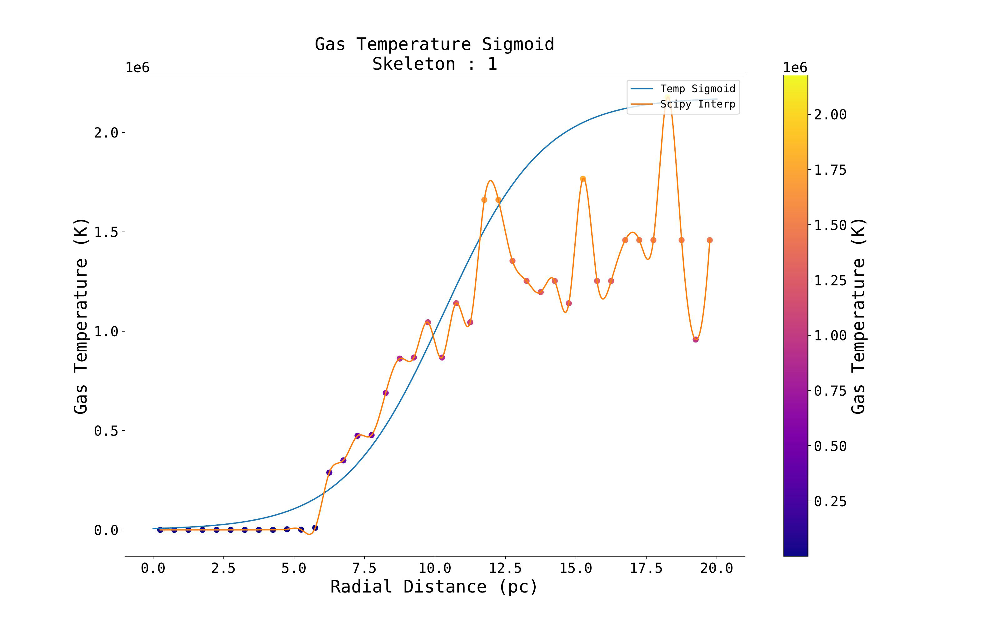

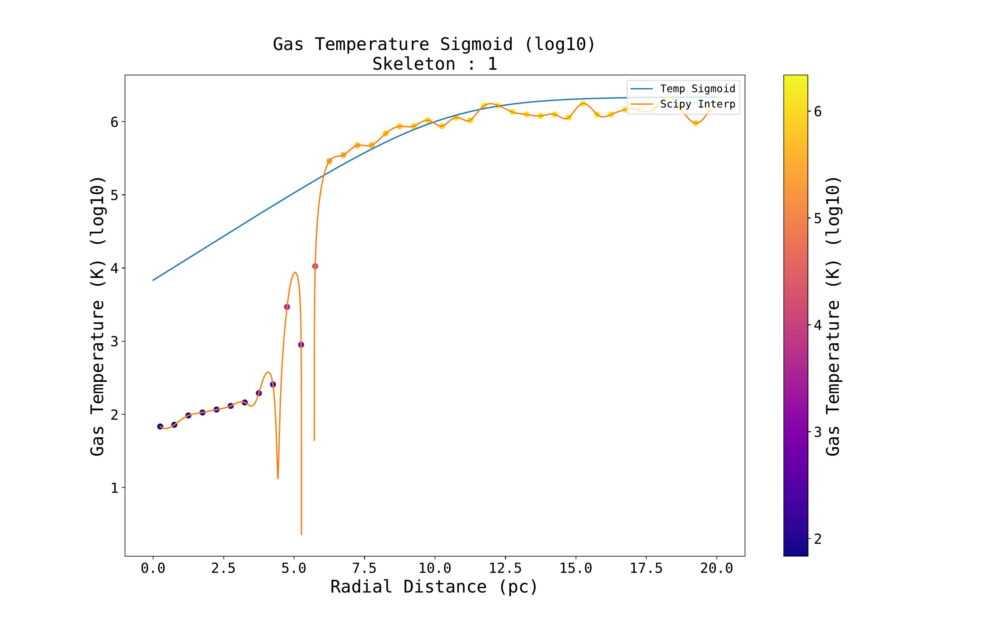

In [52]:
from PIL import Image
import matplotlib.pyplot as plt

cloud_number = 1
page_number = 0

file_name = './pdf_pages_cloud_'+ str(cloud_number) + '/page' + str(page_number) + '.jpg'
im = Image.open(file_name)
display(im)

page_number = 1
file_name = './pdf_pages_cloud_'+ str(cloud_number) + '/page' + str(page_number) + '.jpg'
im = Image.open(file_name)
display(im)

c. Radial Profile Fits for different tracers, with temperature colorbars

As you can see below, when the profile is exponential, the two-component gaussian fit fails

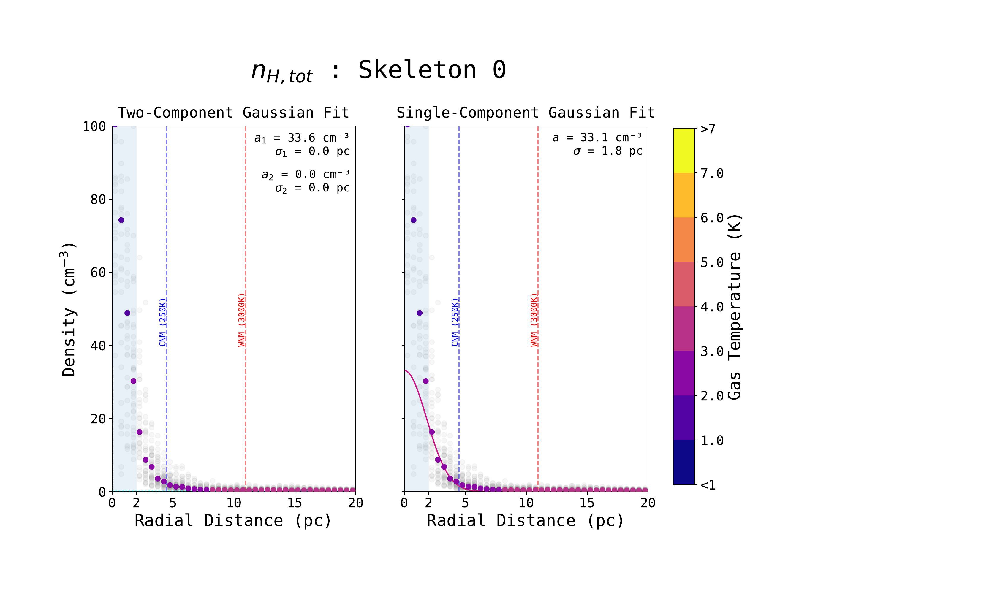

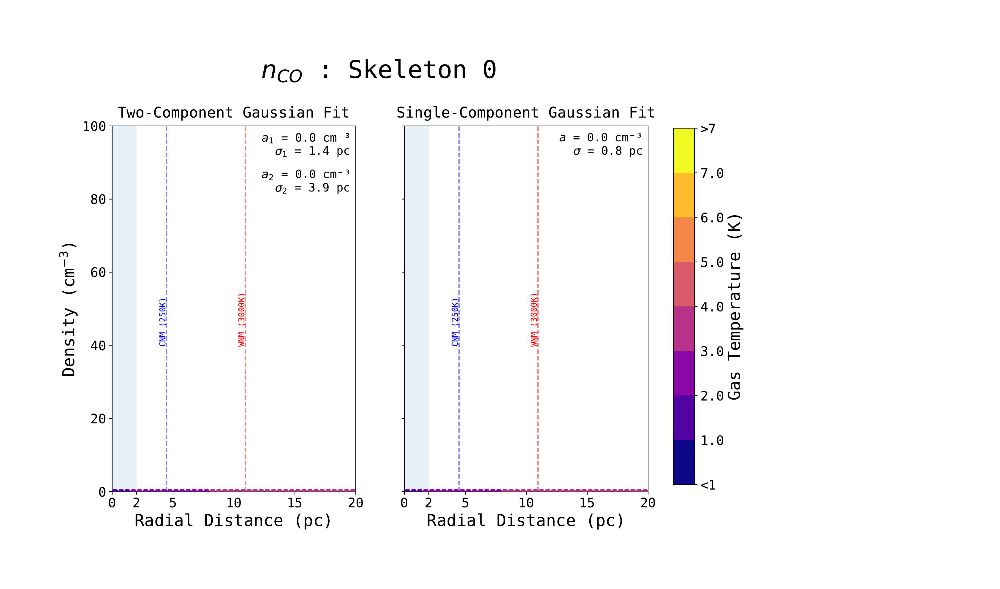

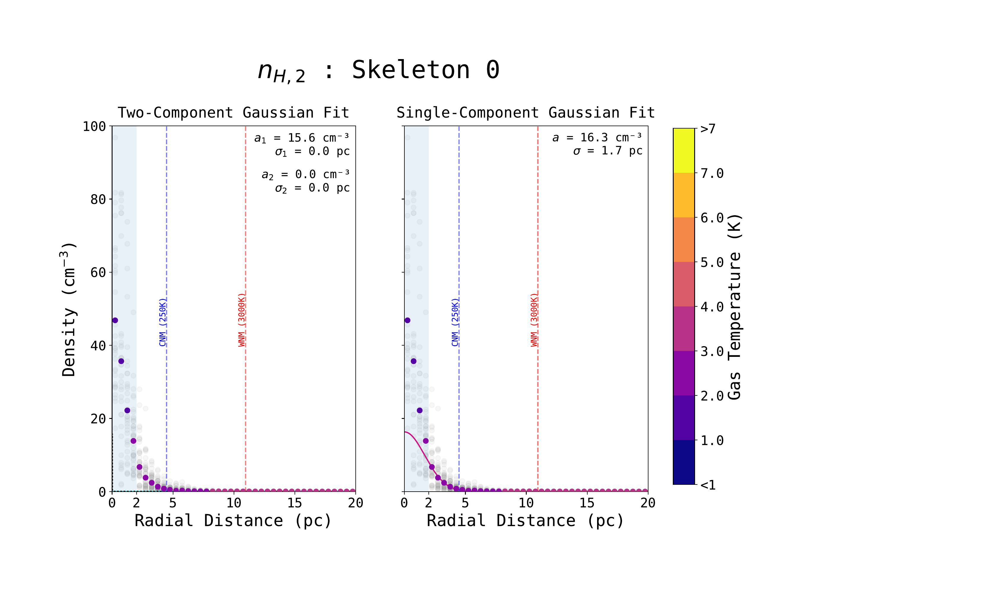

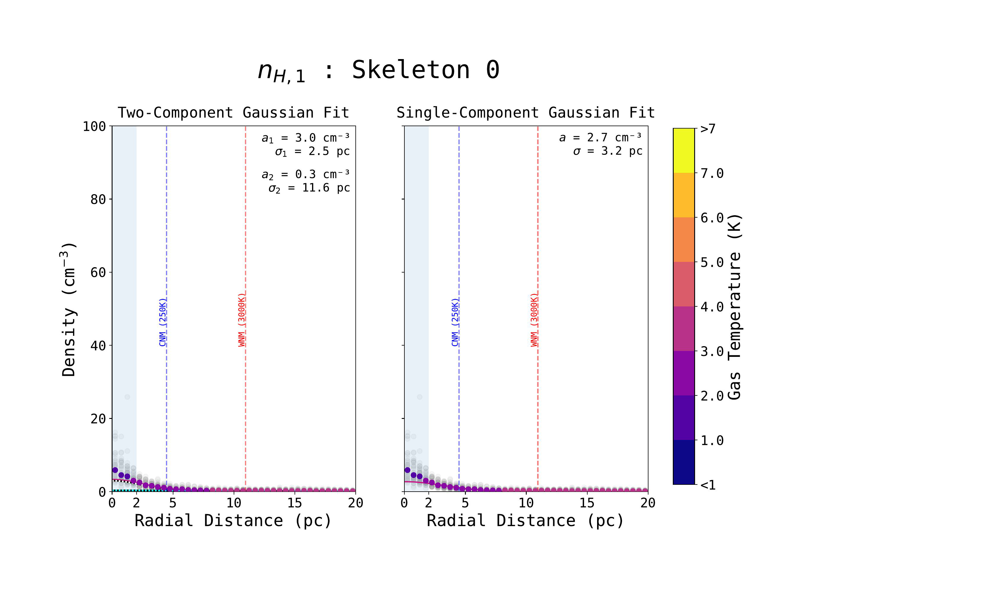

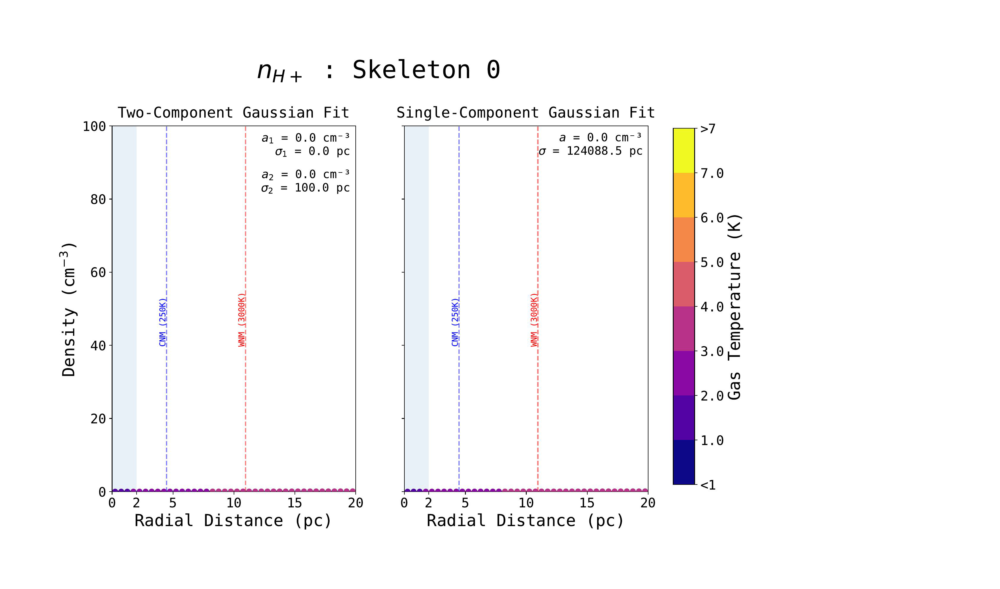

In [53]:
from PIL import Image
import matplotlib.pyplot as plt

cloud_number = 0
page_numbers = [2,3,4,5,6]

for page_number in page_numbers:

    file_name = './pdf_pages_cloud_'+ str(cloud_number) + '/page' + str(page_number) + '.jpg'
    im = Image.open(file_name)
    display(im)


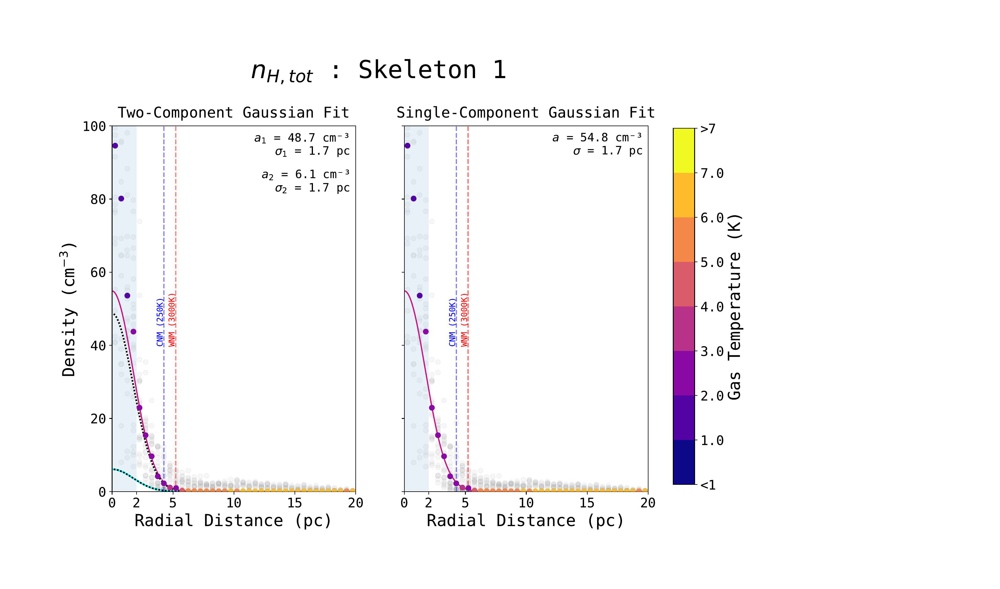

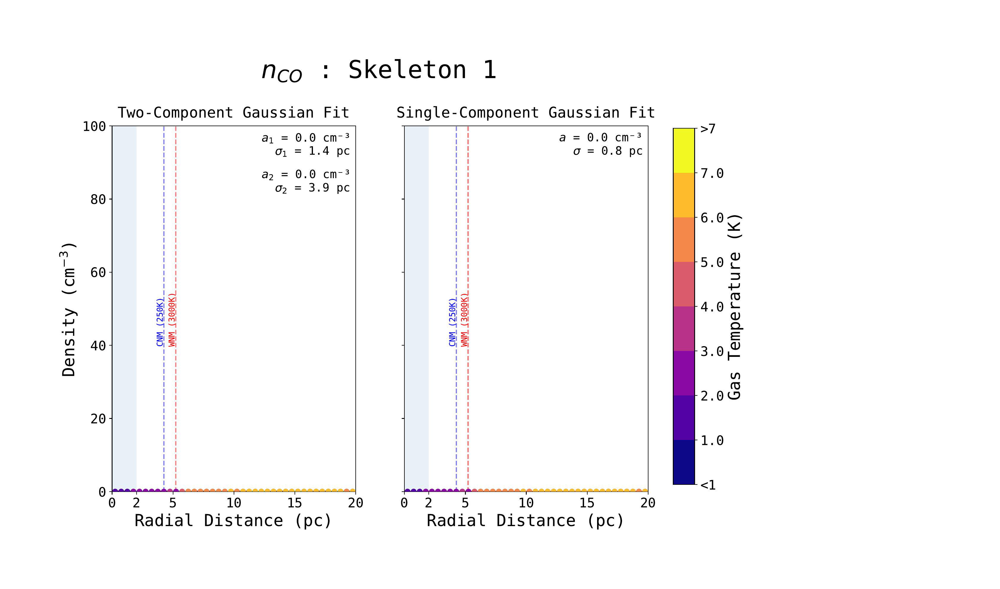

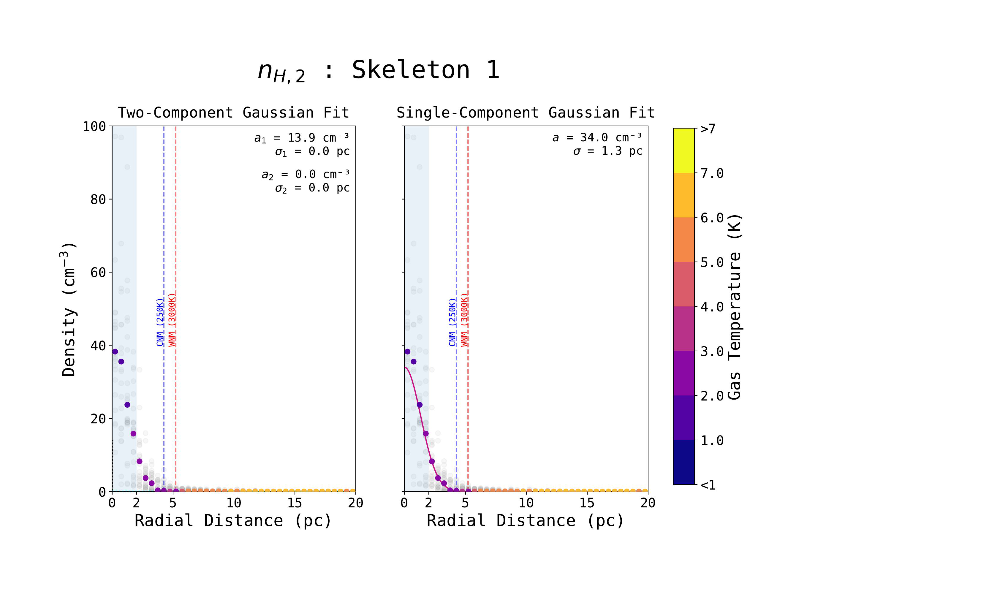

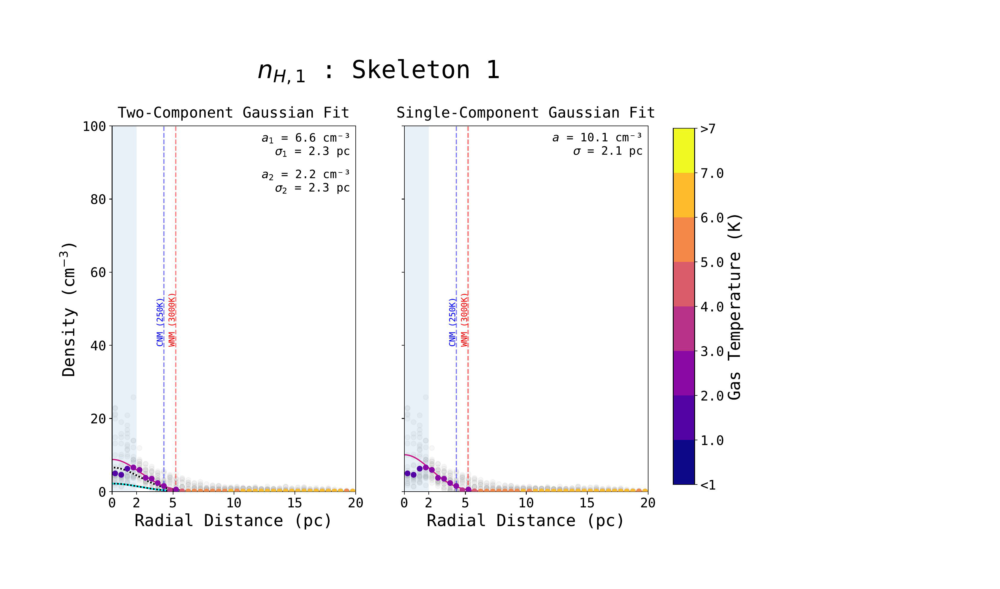

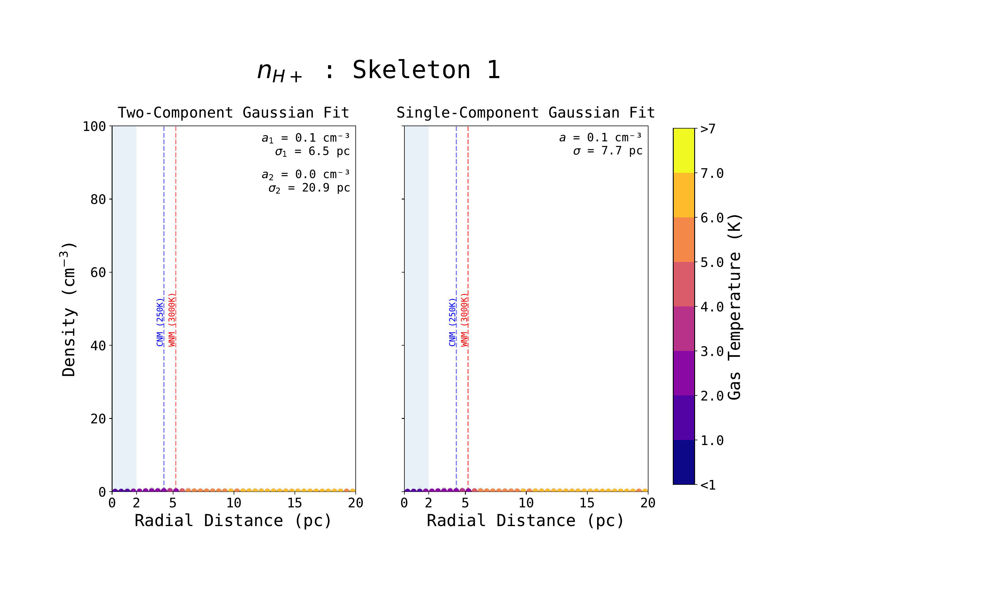

In [54]:
from PIL import Image
import matplotlib.pyplot as plt

cloud_number = 1
page_numbers = [2,3,4,5,6]

for page_number in page_numbers:

    file_name = './pdf_pages_cloud_'+ str(cloud_number) + '/page' + str(page_number) + '.jpg'
    im = Image.open(file_name)
    display(im)

d. pages 7-14 are used to diagnose the shapes of individual tracer gaussians to test whether or not the inner and outer gaussian of nhtot is tracing nh2 and nh1. 

For space, I will just show page 15 which summarizes this. Also, recall that cloud 0 has a failed 2-component fit, so it is also not shown below.

We can see that the profiles of molecular and atomic gas might be tracing the molecular and atomic profiles.

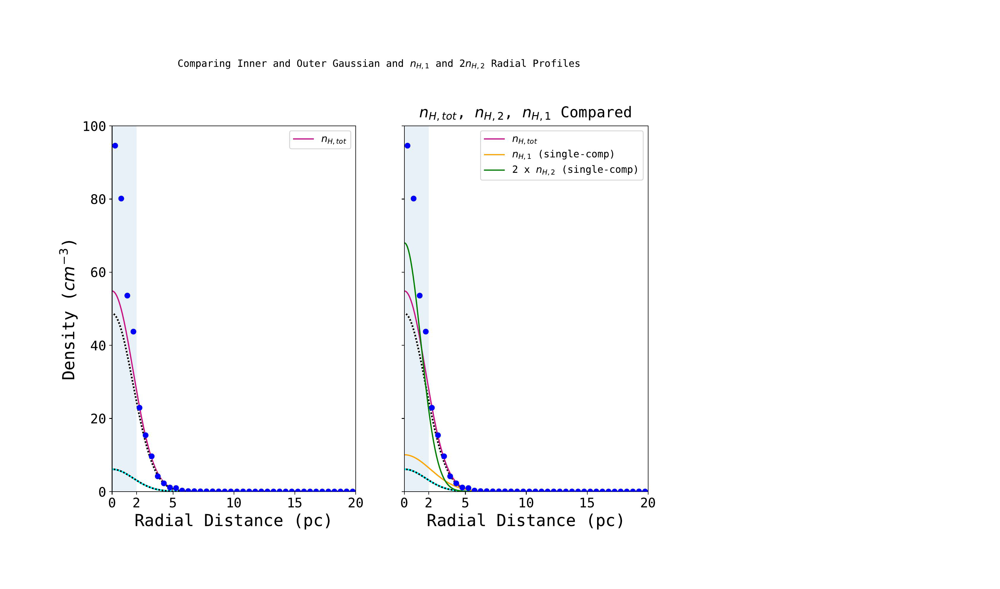

In [60]:
from PIL import Image
import matplotlib.pyplot as plt

cloud_number = 1
page_number = 15

file_name = './pdf_pages_cloud_'+ str(cloud_number) + '/page' + str(page_number) + '.jpg'
im = Image.open(file_name)
display(im)

# 5. Data Tables

Loading and showing all data tables

First, its the gaussian fits without core thresholding and with the inner 2 pc 

Then its the gaussian fits with core thresholding and with the inner 2 pc (if you added core thresholding)

Lastly its the gaussian fits with core thresholding and without the inner 2 pc (if you added Zucker 2021)

The last cell shows how to append number of star forming sinks to the Zucker 2021 table.

In [68]:
table = Table.read('./nht_35_x1470y1400z1400_data_table.dat', format = 'ascii')
table.show_in_notebook()

idx,Designation,Thresholded By (cm^-3),Threshold Level (cm^-3),Skeleton Index,Length (pc),Mass (Solar),NHTOT a1,NHTOT sigma 1,NHTOT a2,NHTOT sigma 2,NHTOT a,NHTOT sigma,NCO a,NCO sigma,NH2 a,NH2 sigma,NH1 a,NH1 sigma,NHTOT Max (cm^-3),NHTOT Median (cm^-3),NHTOT Mean (cm^-3),NCO Max (cm^-3),NCO Median (cm^-3),NCO Mean (cm^-3),NH2 Max (cm^-3),NH2 Median (cm^-3),NH2 Mean (cm^-3),NH1 Max (cm^-3),NH1 Median (cm^-3),NH1 Mean (cm^-3),CO Dark?,Molecular?,Atomic?,Core Shifted?,Core Thresholded?,Thresholded Core (cm^-3),First 2 pc ignored?
0,x1470y1400z1400,nht,35.0,0,65,5857,50.0,0.71,24.0,2.0,67.0,1.1,3.3e-07,0.39,32.0,1.1,3.8,0.39,380.0,46.0,77.0,0.00046,6.4e-08,2e-05,180.0,21.0,36.0,18.0,3.6,4.9,True,True,False,False,False,---,False
1,x1470y1400z1400,nht,35.0,1,36,2294,73.0,1.2,17.0,2.0,88.0,1.4,3.8e-07,0.76,38.0,1.2,6.3,0.76,9600.0,79.0,420.0,1.3,2.9e-07,0.048,4800.0,38.0,210.0,23.0,4.7,8.4,True,True,False,False,False,---,False


In [69]:
core_thresholded_table = Table.read('./nht_35_x1470y1400z1400_data_table_core_thresholded.dat', format = 'ascii')
core_thresholded_table.show_in_notebook()

idx,Designation,Thresholded By (cm^-3),Threshold Level (cm^-3),Skeleton Index,Length (pc),Mass (Solar),NHTOT a1,NHTOT sigma 1,NHTOT a2,NHTOT sigma 2,NHTOT a,NHTOT sigma,NCO a,NCO sigma,NH2 a,NH2 sigma,NH1 a,NH1 sigma,NHTOT Max (cm^-3),NHTOT Median (cm^-3),NHTOT Mean (cm^-3),NCO Max (cm^-3),NCO Median (cm^-3),NCO Mean (cm^-3),NH2 Max (cm^-3),NH2 Median (cm^-3),NH2 Mean (cm^-3),NH1 Max (cm^-3),NH1 Median (cm^-3),NH1 Mean (cm^-3),CO Dark?,Molecular?,Atomic?,Core Shifted?,Core Thresholded?,Thresholded Core (cm^-3),First 2 pc ignored?
0,x1470y1400z1400,nht,35.0,0,65,5857,69.0,0.83,33.0,1.8,98.0,1.1,2.3e-06,0.42,46.0,1.1,5.1,0.42,380.0,46.0,77.0,0.00046,6.4e-08,2e-05,180.0,21.0,36.0,18.0,3.6,4.9,True,True,False,False,True,> 35,False
1,x1470y1400z1400,nht,35.0,1,36,2294,64.0,1.1,32.0,2.0,93.0,1.4,5.1e-07,0.68,40.0,1.3,6.3,0.68,9600.0,79.0,420.0,1.3,2.9e-07,0.048,4800.0,38.0,210.0,23.0,4.7,8.4,True,True,False,False,True,> 35,False


In [70]:
Zucker2021_table = Table.read('./nht_35_x1470y1400z1400_data_table_core_thresholded_Zucker2021.dat', format = 'ascii')
Zucker2021_table.show_in_notebook()

idx,Designation,Thresholded By (cm^-3),Threshold Level (cm^-3),Skeleton Index,Length (pc),Mass (Solar),NHTOT a1,NHTOT sigma 1,NHTOT a2,NHTOT sigma 2,NHTOT a,NHTOT sigma,NCO a,NCO sigma,NH2 a,NH2 sigma,NH1 a,NH1 sigma,NHTOT Max (cm^-3),NHTOT Median (cm^-3),NHTOT Mean (cm^-3),NCO Max (cm^-3),NCO Median (cm^-3),NCO Mean (cm^-3),NH2 Max (cm^-3),NH2 Median (cm^-3),NH2 Mean (cm^-3),NH1 Max (cm^-3),NH1 Median (cm^-3),NH1 Mean (cm^-3),CO Dark?,Molecular?,Atomic?,Core Shifted?,Core Thresholded?,Thresholded Core (cm^-3),First 2 pc ignored?
0,x1470y1400z1400,nht,35.0,0,65,5857,34.0,1.7e-05,7.8e-07,8e-06,33.0,1.8,1.8e-07,0.79,16.0,1.7,2.7,0.79,380.0,46.0,77.0,0.00046,6.4e-08,2e-05,180.0,21.0,36.0,18.0,3.6,4.9,True,True,False,False,True,> 35,True
1,x1470y1400z1400,nht,35.0,1,36,2294,49.0,1.7,6.1,1.7,55.0,1.7,1.8e-07,0.77,34.0,1.3,10.0,0.77,9600.0,79.0,420.0,1.3,2.9e-07,0.048,4800.0,38.0,210.0,23.0,4.7,8.4,True,True,False,False,True,> 35,True


In [71]:
sink_table = Table.read('Number_sinks_per_cloud', format = 'ascii')
sink_table.show_in_notebook()

idx,Designation,Skeleton Index,# Sinks
0,x1470y1400z1400,0,3
1,x1470y1400z1400,1,1


In [81]:
# Combining a table with the sink table

sink_column = []

for row in Zucker2021_table:

    indices_in_stacked_table_designation = np.where(sink_table['Designation'] == row['Designation'])
    indices_in_stacked_table_skeleton_index = np.where(sink_table['Skeleton Index'] == row['Skeleton Index'])

    index = np.intersect1d(indices_in_stacked_table_designation,indices_in_stacked_table_skeleton_index)

    sink_column.append(sink_table[index]['# Sinks'])

stacked_table = hstack([Zucker2021_table, sink_column])
stacked_table.rename_column('col0', 'Number Sinks')

stacked_table.show_in_notebook()

idx,Designation,Thresholded By (cm^-3),Threshold Level (cm^-3),Skeleton Index,Length (pc),Mass (Solar),NHTOT a1,NHTOT sigma 1,NHTOT a2,NHTOT sigma 2,NHTOT a,NHTOT sigma,NCO a,NCO sigma,NH2 a,NH2 sigma,NH1 a,NH1 sigma,NHTOT Max (cm^-3),NHTOT Median (cm^-3),NHTOT Mean (cm^-3),NCO Max (cm^-3),NCO Median (cm^-3),NCO Mean (cm^-3),NH2 Max (cm^-3),NH2 Median (cm^-3),NH2 Mean (cm^-3),NH1 Max (cm^-3),NH1 Median (cm^-3),NH1 Mean (cm^-3),CO Dark?,Molecular?,Atomic?,Core Shifted?,Core Thresholded?,Thresholded Core (cm^-3),First 2 pc ignored?,Number Sinks
0,x1470y1400z1400,nht,35.0,0,65,5857,34.0,1.7e-05,7.8e-07,8e-06,33.0,1.8,1.8e-07,0.79,16.0,1.7,2.7,0.79,380.0,46.0,77.0,0.00046,6.4e-08,2e-05,180.0,21.0,36.0,18.0,3.6,4.9,True,True,False,False,True,> 35,True,3
1,x1470y1400z1400,nht,35.0,1,36,2294,49.0,1.7,6.1,1.7,55.0,1.7,1.8e-07,0.77,34.0,1.3,10.0,0.77,9600.0,79.0,420.0,1.3,2.9e-07,0.048,4800.0,38.0,210.0,23.0,4.7,8.4,True,True,False,False,True,> 35,True,1
